In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime, timedelta
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import warnings

In [3]:
# Suppress warnings
warnings.filterwarnings('ignore')

# Set better visualization defaults
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_context("notebook", font_scale=1.1)
plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams['figure.dpi'] = 100

# Enable interactive Plotly figures in the notebook
import plotly.io as pio
pio.renderers.default = "notebook"

## 1. Data Loading and Initial Preprocessing
Load the CSV data and performing initial preprocessing steps.

In [4]:
# Read the data
data_path = 'data/chapter7'
df = pd.read_csv(data_path + '/x1a-ahu-vav-20250407-20250414.csv')

# Display basic information
print(f"Dataset shape: {df.shape}")
print(f"Number of records: {df.shape[0]}")
print(f"Number of features: {df.shape[1]}")

# Show the first few rows
df.head()

Dataset shape: (10000, 32)
Number of records: 10000
Number of features: 32


,Timestamp,1A-Cx-CAVSSP_PID-SAT_PV_virt,1A-Cx-CAVSSP_PID-SAT_Setpoint_virt,1A-HVP-AHU_EAdamper_POSN_m14c8,1A-HVP-AHU_OAdamper_POSN_m14c6,1A-HVP-AHU_RAdamper_POSN_m14c7,1A-HVP-AHU_RAT_m14c19,1A-HVP-AHU_SAT_m14c18,1A-HVP-AHU_Supply_flow_m13c10,1A-HVP-CHW_FM_m13c7,...,1A-JACE-VAV02-Occupied_HeatingSetpt,1A-JACE-VAV02-Zone_ClgLp,1A-JACE-VAV02-Zone_HtgLp,1A-JACE-VAV02-Zone_Temp,1A-JACE-VAV03-Occupied_CoolingSetpt,1A-JACE-VAV03-Occupied_HeatingSetpt,1A-JACE-VAV03-Zone_ClgLp,1A-JACE-VAV03-Zone_HtgLp,1A-JACE-VAV03-Zone_Temp,1-PLT-OAT_North_m4c9
0,2025-04-06T23:59:00-08:00 GMT+8,17.725670,17.550997,47.034752,95.016136,3.664299,25.626400,17.719355,349.345490,-0.003750,...,70.000000,5.383333,0.0,80.027168,80.000000,70.000000,0.000000,0.0,76.112167,14.047662
1,2025-04-07T00:00:00-08:00 GMT+8,17.723280,17.550997,47.031963,95.015976,3.666528,25.640516,17.715387,352.637115,-0.003838,...,70.000000,5.516667,0.0,80.030334,80.000000,70.000000,0.000000,0.0,76.092003,13.974182
2,2025-04-07T00:01:00-08:00 GMT+8,17.729580,17.557625,47.032452,95.014740,3.157693,25.616282,17.700573,339.943573,-0.003733,...,70.000000,4.200000,0.0,79.989166,80.000000,70.000000,0.000000,0.0,76.116837,14.178016
3,2025-04-07T00:02:00-08:00 GMT+8,17.731928,17.560467,47.034687,95.015808,2.903126,25.630411,17.695518,435.942230,-0.003612,...,61.833332,61.166668,0.0,79.940170,76.199997,63.833332,32.450001,0.0,76.121834,14.152468
4,2025-04-07T00:03:00-08:00 GMT+8,17.721024,17.560467,47.032146,95.016006,2.904833,25.614582,17.425816,1070.879028,-0.003703,...,60.000000,100.000000,0.0,79.947830,74.000000,60.000000,76.233330,0.0,76.113998,14.172671


### 1.1 Data Preprocessing

In [5]:
# Convert timestamp to datetime
df['Timestamp'] = pd.to_datetime(df['Timestamp'].str.replace(' GMT+8', ''))
df.set_index('Timestamp', inplace=True)

# Create simplified column names for easier reference
column_mapping = {}
for column in df.columns:
    # Extract meaningful parts from column names
    if "VAV" in column:
        # Extract VAV number and parameter
        vav_num = column.split('-')[2].replace('VAV', '')
        param = column.split('-')[-1]
        new_name = f"VAV{vav_num}_{param}"
    else:
        # Simplified naming for other columns
        parts = column.split('_')
        if len(parts) > 1:
            # Use the part except the last one
            new_name = '_'.join(parts[:-1])
        else:
            new_name = column
    
    column_mapping[column] = new_name

# Apply the new column names
df.rename(columns=column_mapping, inplace=True)

# Print the new column names
print("New column names:")
for original, new in column_mapping.items():
    print(f"{original} -> {new}")

# Create a dictionary to store the appropriate units for each column
units = {
    # AHU measurements
    'Cx_PID-SAT_PV_virt': '°C',
    'Cx_PID-SAT_Setpoint_virt': '°C',
    'HVP_EAdamper_POSN_m14c8': '%',
    'HVP_OAdamper_POSN_m14c6': '%',
    'HVP_RAdamper_POSN_m14c7': '%',
    'HVP_RAT_m14c19': '°C',
    'HVP_SAT_m14c18': '°C',
    'HVP_Supply_flow_m13c10': 'm³/h',
    
    # Chilled Water
    'HVP_FM_m13c7': 'L/min',
    'HVP_ReturnTemp_m13c6': '°C',
    'HVP_SupplyTemp_m13c5': '°C',
    
    # Hot Water
    'HVP_FM_m13c2': 'L/min',
    'HVP_MV-POSN_m14c0': '%',
    'HVP_ReturnTemp_m13c1': '°C',
    'HVP_SupplyTemp_m13c0': '°C',
    
    # VAV units (using consistent naming)
    'VAV01_Occupied_CoolingSetpt': '°F',
    'VAV01_Occupied_HeatingSetpt': '°F',
    'VAV01_Zone_ClgLp': '%',
    'VAV01_Zone_HtgLp': '%',
    'VAV01_Zone_Temp': '°F',
    'VAV02_Occupied_CoolingSetpt': '°F',
    'VAV02_Occupied_HeatingSetpt': '°F',
    'VAV02_Zone_ClgLp': '%',
    'VAV02_Zone_HtgLp': '%',
    'VAV02_Zone_Temp': '°F',
    'VAV03_Occupied_CoolingSetpt': '°F',
    'VAV03_Occupied_HeatingSetpt': '°F',
    'VAV03_Zone_ClgLp': '%',
    'VAV03_Zone_HtgLp': '%',
    'VAV03_Zone_Temp': '°F',
    
    # Outside Air Temperature
    '1-PLT-OAT_North': '°C'
}

# Generate descriptive statistics
df.describe()

New column names:
1A-Cx-CAVSSP_PID-SAT_PV_virt -> 1A-Cx-CAVSSP_PID-SAT_PV
1A-Cx-CAVSSP_PID-SAT_Setpoint_virt -> 1A-Cx-CAVSSP_PID-SAT_Setpoint
1A-HVP-AHU_EAdamper_POSN_m14c8 -> 1A-HVP-AHU_EAdamper_POSN
1A-HVP-AHU_OAdamper_POSN_m14c6 -> 1A-HVP-AHU_OAdamper_POSN
1A-HVP-AHU_RAdamper_POSN_m14c7 -> 1A-HVP-AHU_RAdamper_POSN
1A-HVP-AHU_RAT_m14c19 -> 1A-HVP-AHU_RAT
1A-HVP-AHU_SAT_m14c18 -> 1A-HVP-AHU_SAT
1A-HVP-AHU_Supply_flow_m13c10 -> 1A-HVP-AHU_Supply_flow
1A-HVP-CHW_FM_m13c7 -> 1A-HVP-CHW_FM
1A-HVP-CHW_ReturnTemp_m13c6 -> 1A-HVP-CHW_ReturnTemp
1A-HVP-CHW_SupplyTemp_m13c5 -> 1A-HVP-CHW_SupplyTemp
1A-HVP-HW_FM_m13c2 -> 1A-HVP-HW_FM
1A-HVP-HW_MV-POSN_m14c0 -> 1A-HVP-HW_MV-POSN
1A-HVP-HW_ReturnTemp_m13c1 -> 1A-HVP-HW_ReturnTemp
1A-HVP-HW_SupplyTemp_m13c0 -> 1A-HVP-HW_SupplyTemp
1A-JACE-VAV01-Occupied_CoolingSetpt -> VAV01_Occupied_CoolingSetpt
1A-JACE-VAV01-Occupied_HeatingSetpt -> VAV01_Occupied_HeatingSetpt
1A-JACE-VAV01-Zone_ClgLp -> VAV01_Zone_ClgLp
1A-JACE-VAV01-Zone_HtgLp -> VAV01_Zone_Ht

,1A-Cx-CAVSSP_PID-SAT_PV,1A-Cx-CAVSSP_PID-SAT_Setpoint,1A-HVP-AHU_EAdamper_POSN,1A-HVP-AHU_OAdamper_POSN,1A-HVP-AHU_RAdamper_POSN,1A-HVP-AHU_RAT,1A-HVP-AHU_SAT,1A-HVP-AHU_Supply_flow,1A-HVP-CHW_FM,1A-HVP-CHW_ReturnTemp,...,VAV02_Occupied_HeatingSetpt,VAV02_Zone_ClgLp,VAV02_Zone_HtgLp,VAV02_Zone_Temp,VAV03_Occupied_CoolingSetpt,VAV03_Occupied_HeatingSetpt,VAV03_Zone_ClgLp,VAV03_Zone_HtgLp,VAV03_Zone_Temp,1-PLT-OAT_North
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,...,9999.000000,9999.000000,9999.0,9999.000000,9999.000000,9999.000000,9999.000000,9999.000000,9999.000000,10000.000000
mean,13.785155,12.445986,22.705491,44.093553,53.524935,22.629734,15.995694,737.969805,10.354275,12.436157,...,67.571115,35.395590,0.0,74.682336,75.340754,67.571134,36.160248,3.388200,73.915454,16.361660
std,2.012085,2.593567,23.512468,44.671961,47.404420,1.107716,4.318910,478.464165,10.055125,2.531906,...,4.126712,37.434709,0.0,1.245109,2.394029,4.126370,44.153929,17.536767,3.053555,3.879280
min,9.598591,0.000000,0.097228,0.234114,-0.657852,20.829212,9.275385,312.854126,-0.004367,5.680284,...,60.000000,0.000000,0.0,73.168503,74.000000,60.000000,0.000000,0.000000,66.941170,8.992517
25%,12.452811,11.666667,0.123607,0.261721,-0.393931,21.620308,12.553829,339.364944,-0.003632,10.882712,...,67.000000,0.000000,0.0,73.955833,74.000000,67.000000,0.000000,0.000000,71.779915,13.235822
50%,13.589261,11.666667,3.716328,8.712712,91.209946,22.497699,14.521720,433.435486,6.652396,11.906567,...,70.000000,22.733334,0.0,74.047668,74.000000,70.000000,0.000000,0.000000,73.778831,15.672703
75%,14.693951,15.069987,49.439691,94.747629,99.876564,23.449738,19.180662,1150.597809,21.762857,13.175745,...,70.000000,58.016666,0.0,75.003750,74.000000,70.000000,100.000000,0.000000,74.757084,19.046968
max,26.008150,17.560467,49.452225,95.030823,99.890274,25.640516,26.005371,2090.926270,31.807337,22.536461,...,70.000000,100.000000,0.0,80.551170,80.000000,70.000000,100.000000,100.000000,82.659332,26.144106


### 1.2 Data Type Conversion and Consistency Checks
Make sure all data types are appropriate and check for any initial issues.

In [6]:
# Convert all columns to numeric (they should already be, but this ensures consistency)
for col in df.columns:
    df[col] = pd.to_numeric(df[col], errors='coerce')

# Check for missing values
missing_values = df.isnull().sum()
print("Missing values in each column:")
print(missing_values)

# Check for outliers (using IQR method)
def identify_outliers(df):
    outliers = {}
    for column in df.columns:
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers[column] = ((df[column] < lower_bound) | (df[column] > upper_bound)).sum()
    return outliers

outliers = identify_outliers(df)
print("\nNumber of potential outliers in each column:")
for col, count in outliers.items():
    if count > 0:
        print(f"{col}: {count}")


Missing values in each column:
1A-Cx-CAVSSP_PID-SAT_PV          0
1A-Cx-CAVSSP_PID-SAT_Setpoint    0
1A-HVP-AHU_EAdamper_POSN         0
1A-HVP-AHU_OAdamper_POSN         0
1A-HVP-AHU_RAdamper_POSN         0
1A-HVP-AHU_RAT                   0
1A-HVP-AHU_SAT                   0
1A-HVP-AHU_Supply_flow           0
1A-HVP-CHW_FM                    0
1A-HVP-CHW_ReturnTemp            0
1A-HVP-CHW_SupplyTemp            0
1A-HVP-HW_FM                     0
1A-HVP-HW_MV-POSN                0
1A-HVP-HW_ReturnTemp             0
1A-HVP-HW_SupplyTemp             0
VAV01_Occupied_CoolingSetpt      1
VAV01_Occupied_HeatingSetpt      1
VAV01_Zone_ClgLp                 1
VAV01_Zone_HtgLp                 1
VAV01_Zone_Temp                  1
VAV02_Occupied_CoolingSetpt      1
VAV02_Occupied_HeatingSetpt      1
VAV02_Zone_ClgLp                 1
VAV02_Zone_HtgLp                 1
VAV02_Zone_Temp                  1
VAV03_Occupied_CoolingSetpt      1
VAV03_Occupied_HeatingSetpt      1
VAV03_Zone_ClgLp        

### 1.3 Temperature Unit Conversion
Since we have temperature measurements in both °C and °F, let's create consistent temperature columns by converting all to °C.

In [7]:
# Function to convert Fahrenheit to Celsius
def f_to_c(temp_f):
    return (temp_f - 32) * 5 / 9

# Convert all VAV temperature values from F to C
for col in df.columns:
    if 'VAV' in col and ('Temp' in col or 'Setpt' in col):
        df[f"{col}_C"] = f_to_c(df[col])

# Display the first few rows with converted temperatures
temperature_columns = [col for col in df.columns if 'Temp' in col or 'Setpt' in col]
df[temperature_columns].head()

,1A-HVP-CHW_ReturnTemp,1A-HVP-CHW_SupplyTemp,1A-HVP-HW_ReturnTemp,1A-HVP-HW_SupplyTemp,VAV01_Occupied_CoolingSetpt,VAV01_Occupied_HeatingSetpt,VAV01_Zone_Temp,VAV02_Occupied_CoolingSetpt,VAV02_Occupied_HeatingSetpt,VAV02_Zone_Temp,...,VAV03_Zone_Temp,VAV01_Occupied_CoolingSetpt_C,VAV01_Occupied_HeatingSetpt_C,VAV01_Zone_Temp_C,VAV02_Occupied_CoolingSetpt_C,VAV02_Occupied_HeatingSetpt_C,VAV02_Zone_Temp_C,VAV03_Occupied_CoolingSetpt_C,VAV03_Occupied_HeatingSetpt_C,VAV03_Zone_Temp_C
Timestamp,,,,,,,,,,,,,,,,,,,,,
2025-04-06 23:59:00-08:00,13.339764,11.805918,54.160069,56.552292,80.000000,70.000000,78.290337,80.0,70.000000,80.027168,...,76.112167,26.666667,21.111111,25.716854,26.666667,21.111111,26.681760,26.666667,21.111111,24.506760
2025-04-07 00:00:00-08:00,13.339400,11.808234,54.248199,56.587704,80.000000,70.000000,78.290169,80.0,70.000000,80.030334,...,76.092003,26.666667,21.111111,25.716760,26.666667,21.111111,26.683519,26.666667,21.111111,24.495557
2025-04-07 00:01:00-08:00,13.339435,11.812600,54.303020,56.620571,79.900002,69.833336,78.276833,80.0,70.000000,79.989166,...,76.116837,26.611112,21.018520,25.709351,26.666667,21.111111,26.660648,26.666667,21.111111,24.509354
2025-04-07 00:02:00-08:00,13.337449,11.816528,54.290234,56.596203,74.000000,60.000000,78.261497,75.0,61.833332,79.940170,...,76.121834,23.333333,15.555556,25.700832,23.888889,16.574073,26.633428,24.555554,17.685184,24.512130
2025-04-07 00:03:00-08:00,13.337246,11.821356,54.310200,56.523682,74.000000,60.000000,78.276665,74.0,60.000000,79.947830,...,76.113998,23.333333,15.555556,25.709258,23.333333,15.555556,26.637683,23.333333,15.555556,24.507777


## 2. Exploratory Data Analysis
### 2.1 Basic Statistical Summary

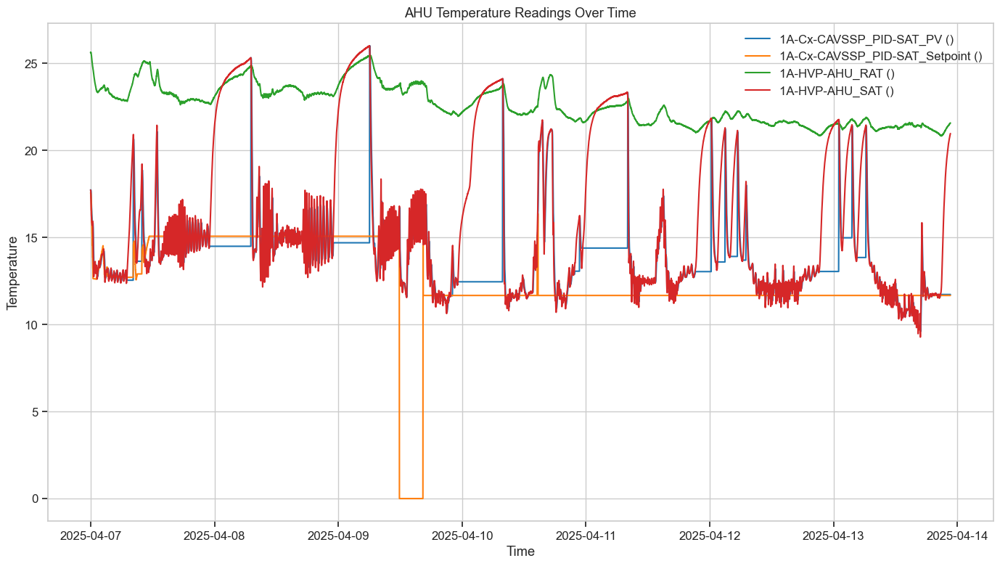

In [8]:
# Create a time series plot for the AHU temperatures
plt.figure(figsize=(14, 8))

# Select temperature-related columns for AHU
ahu_temp_cols = [col for col in df.columns if ('SAT' in col or 'RAT' in col or 'Cx_PID' in col) and not col.endswith('_C')]
for col in ahu_temp_cols:
    plt.plot(df.index, df[col], label=f"{col} ({units.get(col, '')})")

plt.title('AHU Temperature Readings Over Time')
plt.xlabel('Time')
plt.ylabel('Temperature')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

### 2.3 Interactive Time Series Visualization with Plotly
Create an interactive time series visualization for multiple parameters

In [9]:
def create_interactive_timeseries(dataframe, column_groups, title):
    fig = make_subplots(rows=len(column_groups), cols=1, 
                         subplot_titles=[group['name'] for group in column_groups],
                         shared_xaxes=True, 
                         vertical_spacing=0.1)
    
    for i, group in enumerate(column_groups):
        for col in group['columns']:
            unit = units.get(col, '')
            fig.add_trace(
                go.Scatter(x=dataframe.index, y=dataframe[col], name=f"{col} ({unit})"),
                row=i+1, col=1
            )
    
    fig.update_layout(
        title=title,
        height=200 * len(column_groups),
        width=1000,
        showlegend=True,
        legend=dict(orientation="h", yanchor="bottom", y=-0.2)
    )
    
    return fig

# Define column groups for visualization
column_groups = [
    {'name': 'AHU Supply & Return Air Temperatures', 
     'columns': ['1A-HVP-AHU_SAT', '1A-HVP-AHU_RAT', '1A-Cx-CAVSSP_PID-SAT_Setpoint']},
    {'name': 'Damper Positions', 
     'columns': ['1A-HVP-AHU_OAdamper_POSN', '1A-HVP-AHU_RAdamper_POSN', '1A-HVP-AHU_EAdamper_POSN']},
    {'name': 'VAV Zone Temperatures', 
     'columns': ['VAV01_Zone_Temp_C', 'VAV02_Zone_Temp_C', 'VAV03_Zone_Temp_C']}
]

# Create and display the interactive plot
fig = create_interactive_timeseries(df, column_groups, 'HVAC System Parameters Over Time')
fig.show()

### 2.4 Correlation Analysis
Examine how different parameters in the system correlate with each other.

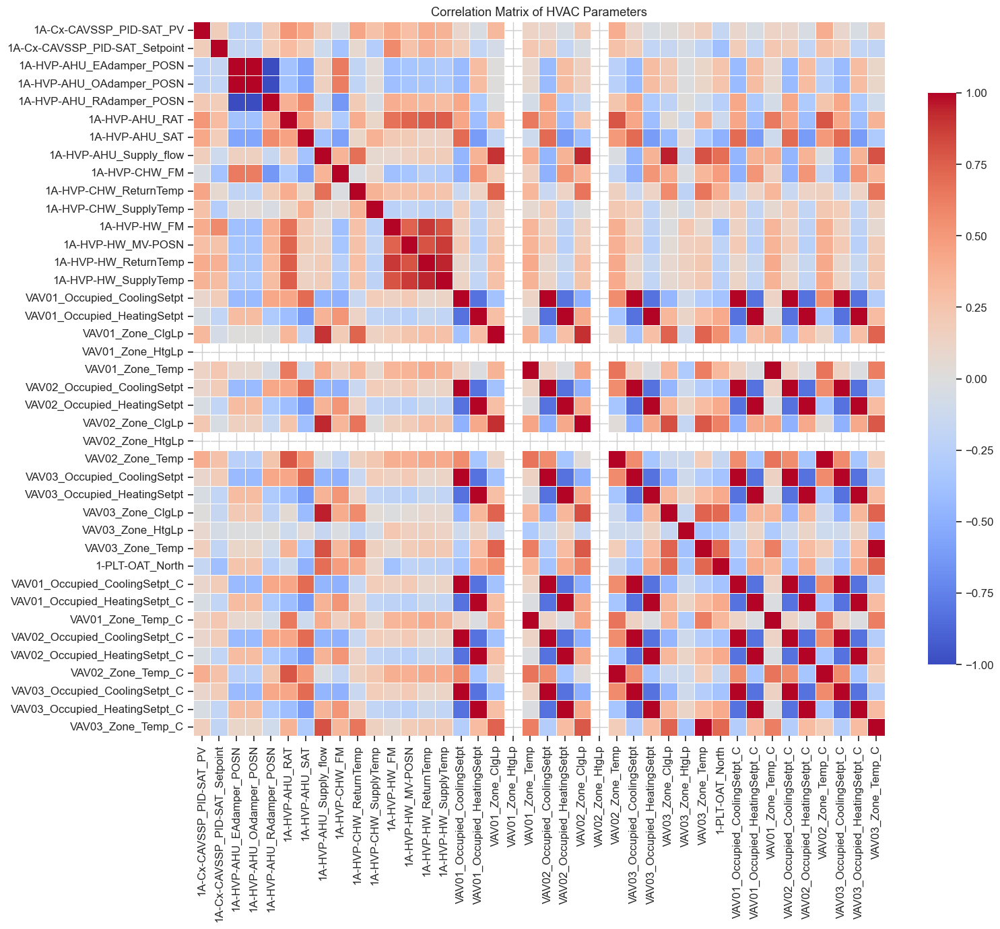

In [10]:
# Calculate correlations between parameters
correlation_matrix = df.corr()

# Visualize the correlation matrix using a heatmap
plt.figure(figsize=(16, 14))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', vmin=-1, vmax=1, 
            linewidths=0.5, cbar_kws={"shrink": 0.8})
plt.title('Correlation Matrix of HVAC Parameters')
plt.tight_layout()
plt.show()

### 3.1 VAV Temperature Control Performance
Analyze how well each VAV unit maintains its zone temperature within the setpoint range.


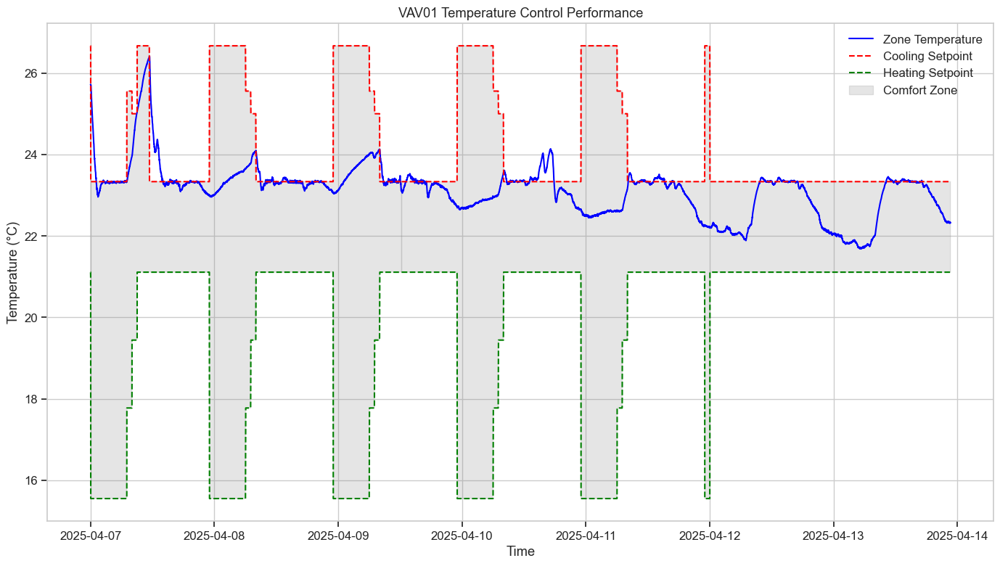

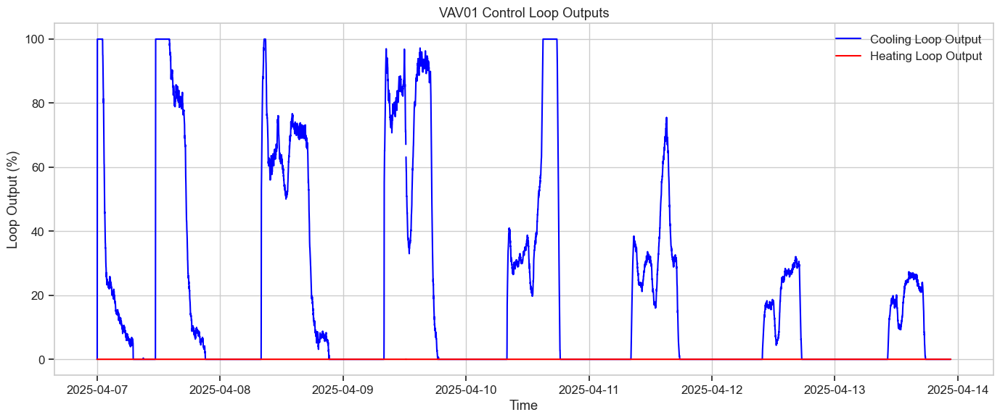

VAV01 Performance Statistics:
Mean Temperature: 23.13°C
Temperature Standard Deviation: 0.65°C
Time within setpoint deadband: 77.15%


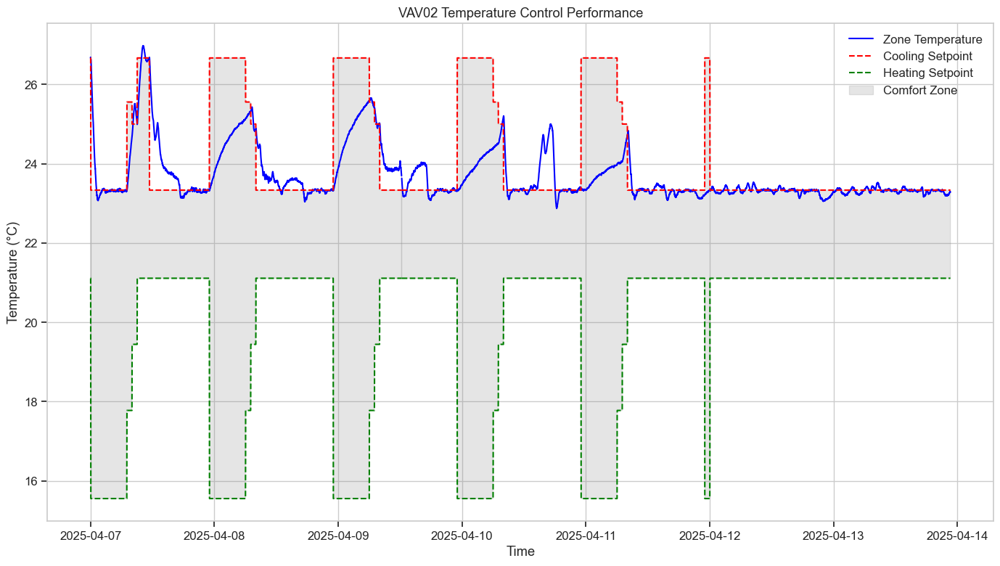

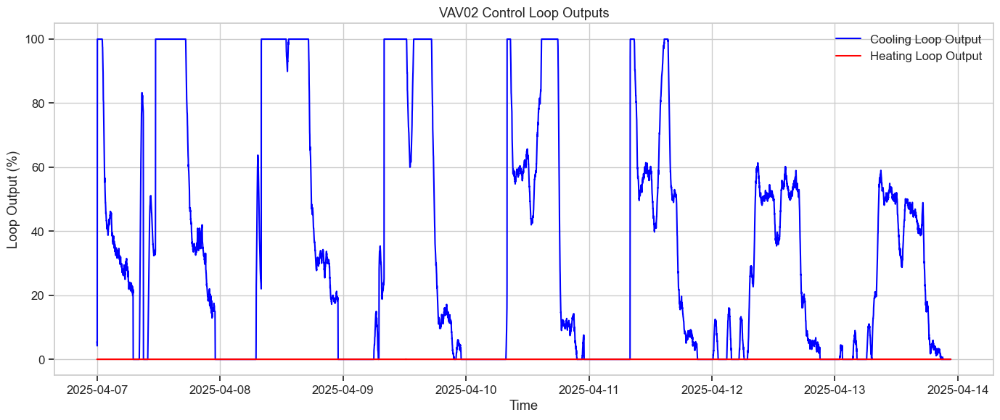

VAV02 Performance Statistics:
Mean Temperature: 23.71°C
Temperature Standard Deviation: 0.69°C
Time within setpoint deadband: 60.74%


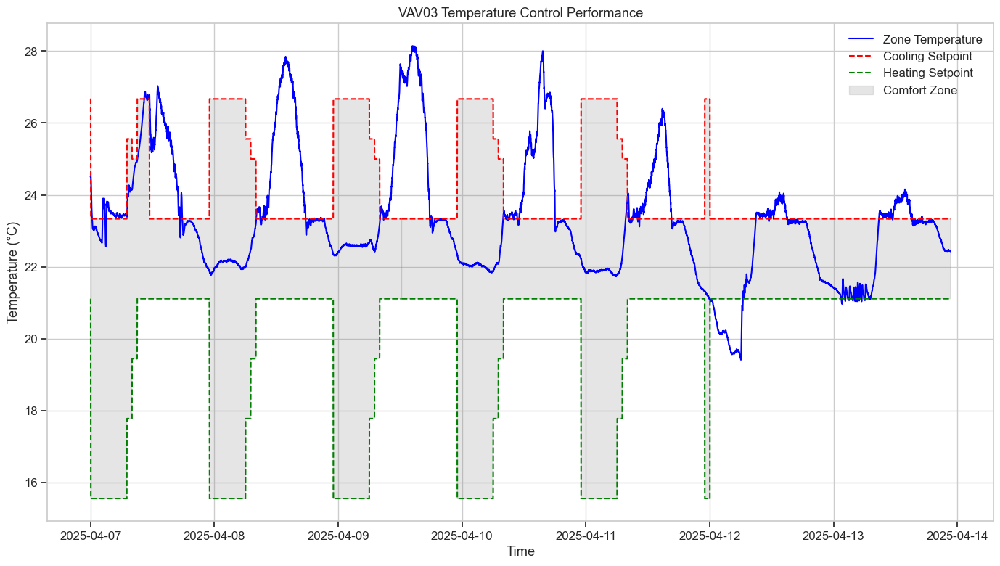

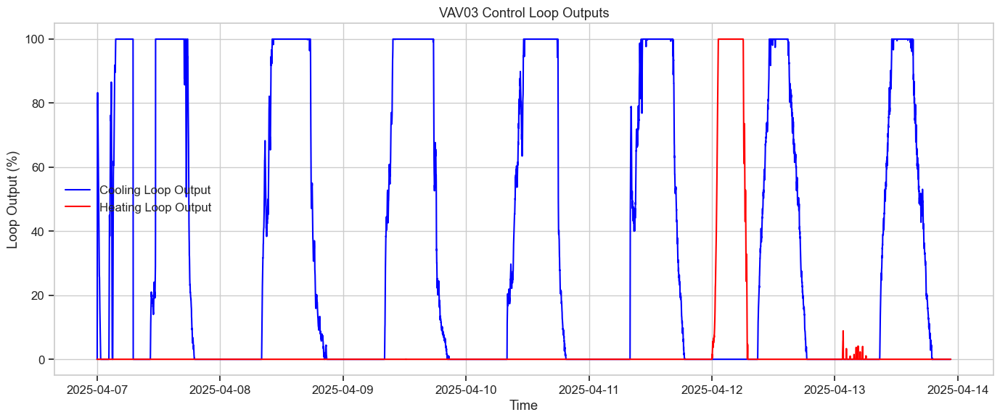

VAV03 Performance Statistics:
Mean Temperature: 23.29°C
Temperature Standard Deviation: 1.70°C
Time within setpoint deadband: 58.82%


,Mean Temperature (°C),Temperature Std Dev (°C),% Within Deadband
01,23.131619,0.650644,77.15
02,23.712409,0.691727,60.74
03,23.286363,1.696419,58.82


In [11]:
# Function to analyze VAV temperature control performance
def analyze_vav_performance(df, vav_num):
    # Extract relevant columns for this VAV
    zone_temp = f"VAV{vav_num}_Zone_Temp_C"
    cooling_sp = f"VAV{vav_num}_Occupied_CoolingSetpt_C"
    heating_sp = f"VAV{vav_num}_Occupied_HeatingSetpt_C"
    cooling_loop = f"VAV{vav_num}_Zone_ClgLp"
    heating_loop = f"VAV{vav_num}_Zone_HtgLp"
    
    # Calculate statistics
    mean_temp = df[zone_temp].mean()
    std_temp = df[zone_temp].std()
    
    # Calculate temperature deviation from setpoint
    df[f'VAV{vav_num}_cooling_deviation'] = df[zone_temp] - df[cooling_sp]
    df[f'VAV{vav_num}_heating_deviation'] = df[heating_sp] - df[zone_temp]
    
    # Calculate percentage of time within deadband
    within_deadband = ((df[zone_temp] <= df[cooling_sp]) & 
                        (df[zone_temp] >= df[heating_sp])).mean() * 100
    
    # Plot the temperature and setpoints
    plt.figure(figsize=(14, 8))
    
    # Plot zone temperature
    plt.plot(df.index, df[zone_temp], 'b-', label='Zone Temperature')
    
    # Plot cooling and heating setpoints
    plt.plot(df.index, df[cooling_sp], 'r--', label='Cooling Setpoint')
    plt.plot(df.index, df[heating_sp], 'g--', label='Heating Setpoint')
    
    # Fill the deadband area
    plt.fill_between(df.index, df[heating_sp], df[cooling_sp], color='gray', alpha=0.2, label='Comfort Zone')
    
    plt.title(f'VAV{vav_num} Temperature Control Performance')
    plt.xlabel('Time')
    plt.ylabel('Temperature (°C)')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()
    
    # Additional plot showing control loops
    plt.figure(figsize=(14, 6))
    plt.plot(df.index, df[cooling_loop], 'b-', label='Cooling Loop Output')
    plt.plot(df.index, df[heating_loop], 'r-', label='Heating Loop Output')
    plt.title(f'VAV{vav_num} Control Loop Outputs')
    plt.xlabel('Time')
    plt.ylabel('Loop Output (%)')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()
    
    # Print statistics
    print(f"VAV{vav_num} Performance Statistics:")
    print(f"Mean Temperature: {mean_temp:.2f}°C")
    print(f"Temperature Standard Deviation: {std_temp:.2f}°C")
    print(f"Time within setpoint deadband: {within_deadband:.2f}%")
    
    # Return relevant data for further analysis
    return {
        'mean_temp': mean_temp,
        'std_temp': std_temp,
        'within_deadband': within_deadband
    }

# Analyze each VAV unit
vav_stats = {}
for vav_num in ['01', '02', '03']:
    vav_stats[vav_num] = analyze_vav_performance(df, vav_num)

# Create a comparative summary
vav_summary = pd.DataFrame.from_dict(vav_stats, orient='index')
vav_summary.columns = ['Mean Temperature (°C)', 'Temperature Std Dev (°C)', '% Within Deadband']
vav_summary

### 3.2 VAV Response to Load Changes
Analyze how VAVs respond to changing loads by examining the correlation between zone temperature and control loop outputs.


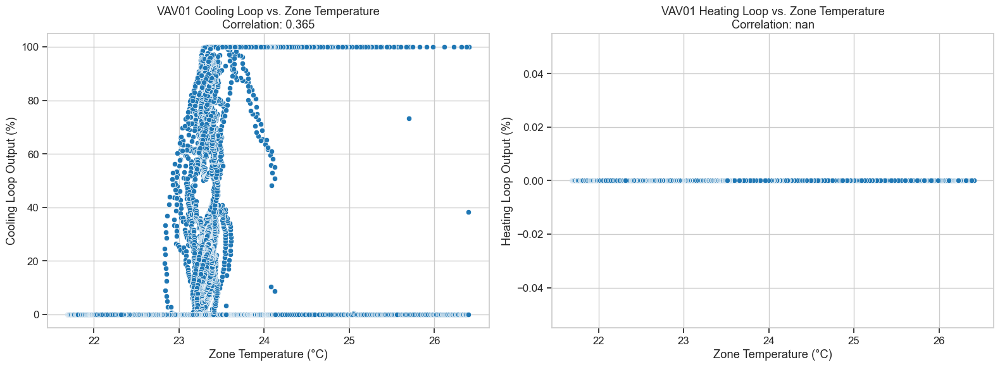

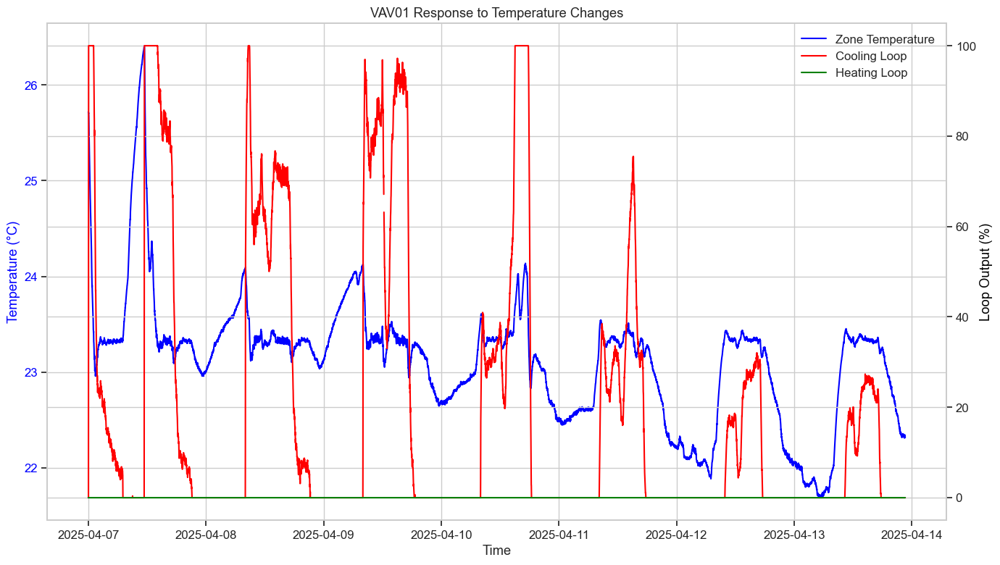

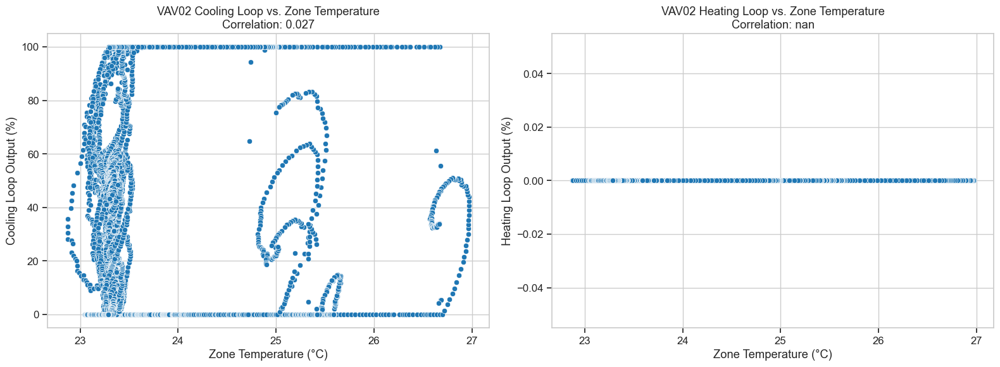

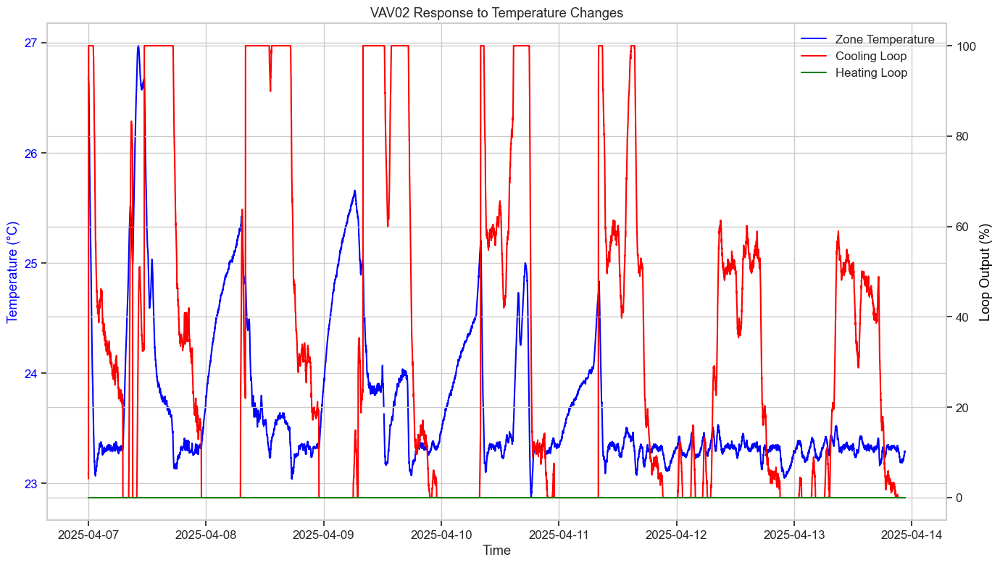

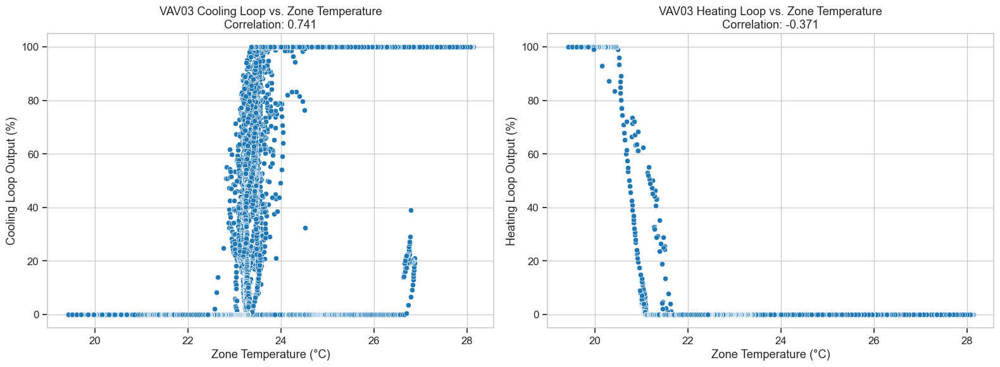

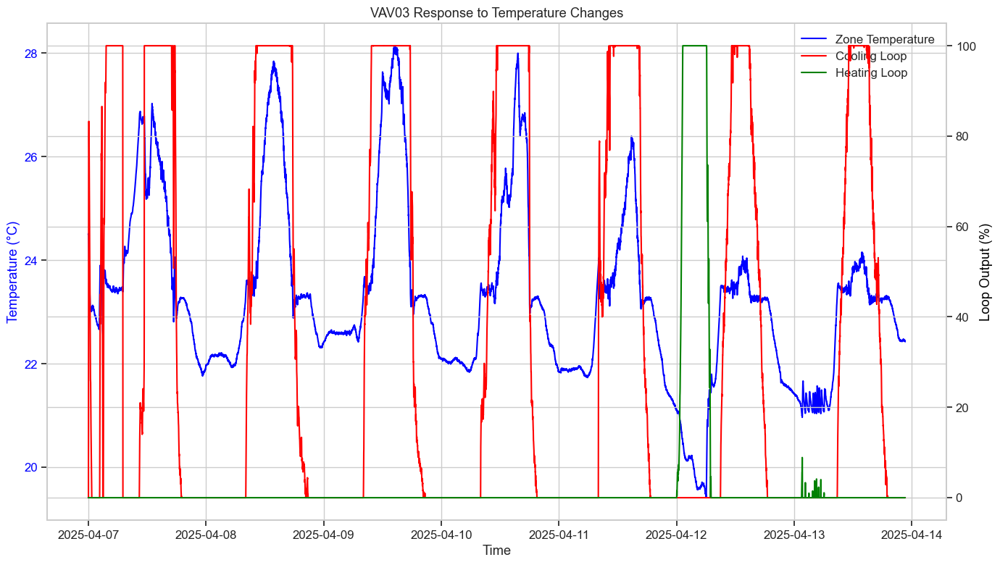

,Cooling Loop Correlation,Heating Loop Correlation
01,0.364822,NaN
02,0.026553,NaN
03,0.740696,-0.371161


In [12]:
# Function to analyze VAV response to load changes
def analyze_vav_response(df, vav_num):
    # Extract relevant columns
    zone_temp = f"VAV{vav_num}_Zone_Temp_C"
    cooling_loop = f"VAV{vav_num}_Zone_ClgLp"
    heating_loop = f"VAV{vav_num}_Zone_HtgLp"
    
    # Calculate correlations
    cooling_corr = df[[zone_temp, cooling_loop]].corr().iloc[0, 1]
    heating_corr = df[[zone_temp, heating_loop]].corr().iloc[0, 1]
    
    # Create a scatter plot of temperature vs. loop outputs
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    
    # Cooling loop
    sns.scatterplot(x=df[zone_temp], y=df[cooling_loop], ax=axes[0])
    axes[0].set_title(f'VAV{vav_num} Cooling Loop vs. Zone Temperature\nCorrelation: {cooling_corr:.3f}')
    axes[0].set_xlabel('Zone Temperature (°C)')
    axes[0].set_ylabel('Cooling Loop Output (%)')
    axes[0].grid(True)
    
    # Heating loop
    sns.scatterplot(x=df[zone_temp], y=df[heating_loop], ax=axes[1])
    axes[1].set_title(f'VAV{vav_num} Heating Loop vs. Zone Temperature\nCorrelation: {heating_corr:.3f}')
    axes[1].set_xlabel('Zone Temperature (°C)')
    axes[1].set_ylabel('Heating Loop Output (%)')
    axes[1].grid(True)
    
    plt.tight_layout()
    plt.show()
    
    # Create a time series plot showing temperature and control loop responses
    plt.figure(figsize=(14, 8))
    
    # First axis for temperature
    ax1 = plt.gca()
    ax1.plot(df.index, df[zone_temp], 'b-', label='Zone Temperature')
    ax1.set_xlabel('Time')
    ax1.set_ylabel('Temperature (°C)', color='b')
    ax1.tick_params(axis='y', labelcolor='b')
    
    # Second axis for loop outputs
    ax2 = ax1.twinx()
    ax2.plot(df.index, df[cooling_loop], 'r-', label='Cooling Loop')
    ax2.plot(df.index, df[heating_loop], 'g-', label='Heating Loop')
    ax2.set_ylabel('Loop Output (%)', color='k')
    
    # Add legends
    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper right')
    
    plt.title(f'VAV{vav_num} Response to Temperature Changes')
    plt.grid(True)
    plt.tight_layout()
    plt.show()
    
    return {
        'cooling_correlation': cooling_corr,
        'heating_correlation': heating_corr
    }

# Analyze response for each VAV
vav_response = {}
for vav_num in ['01', '02', '03']:
    vav_response[vav_num] = analyze_vav_response(df, vav_num)

# Create a summary table
response_summary = pd.DataFrame.from_dict(vav_response, orient='index')
response_summary.columns = ['Cooling Loop Correlation', 'Heating Loop Correlation']
response_summary

### 3.3 VAV Energy Efficiency Analysis
Analyze the energy efficiency of each VAV by examining the relationship between the control loop outputs and the AHU supply parameters.


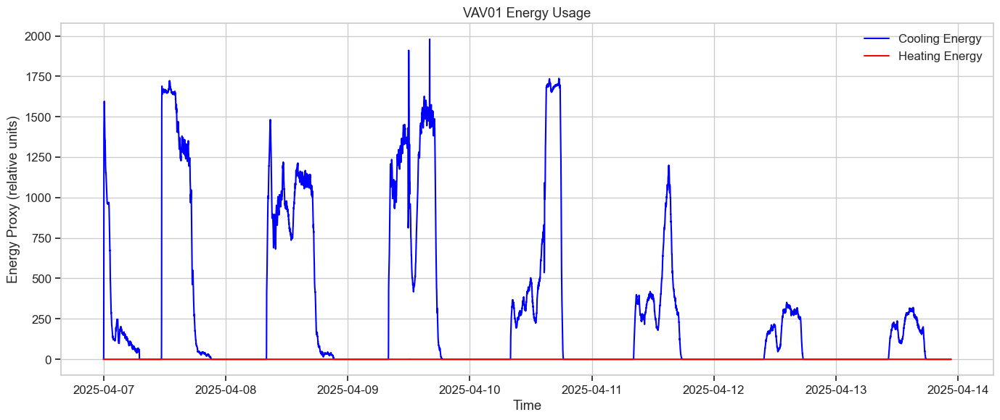

VAV01 Energy Efficiency Analysis:
Mean Cooling Energy Usage: 284.10
Mean Heating Energy Usage: 0.00
Total Energy Usage: 284.10
Cooling Efficiency Metric: 0.0719
Heating Efficiency Metric: 0.0000


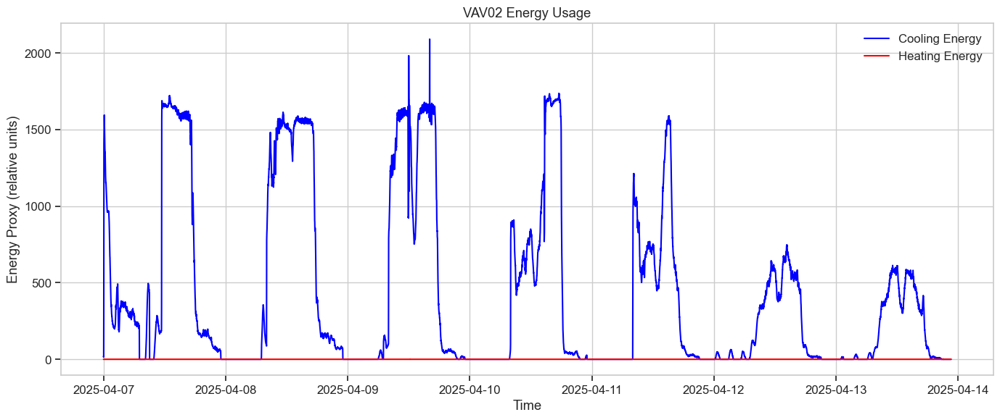

VAV02 Energy Efficiency Analysis:
Mean Cooling Energy Usage: 427.87
Mean Heating Energy Usage: 0.00
Total Energy Usage: 427.87
Cooling Efficiency Metric: 0.0827
Heating Efficiency Metric: 0.0000


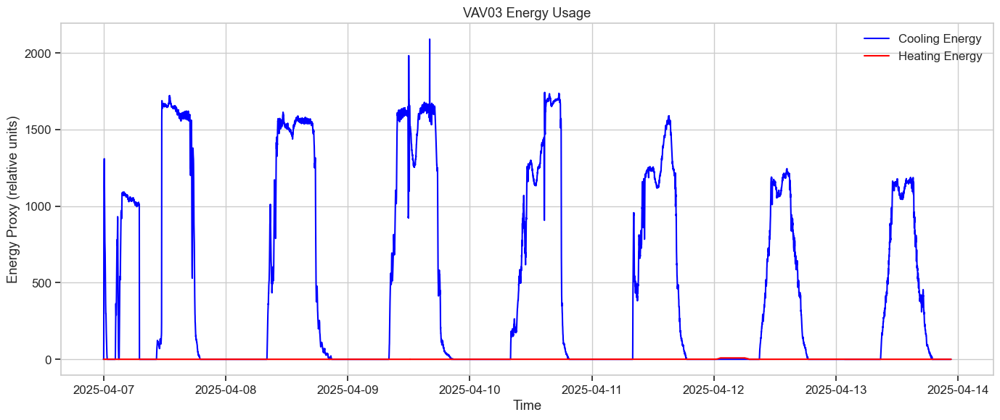

VAV03 Energy Efficiency Analysis:
Mean Cooling Energy Usage: 467.45
Mean Heating Energy Usage: 0.29
Total Energy Usage: 467.74
Cooling Efficiency Metric: 0.0774
Heating Efficiency Metric: 11.5494


,cooling_energy,heating_energy,total_energy,cooling_efficiency,heating_efficiency
01,284.101489,0.000000,284.101489,0.071867,0.00000
02,427.870996,0.000000,427.870996,0.082725,0.00000
03,467.448319,0.293367,467.741686,0.077357,11.54935


In [13]:
# Function to analyze VAV energy efficiency
def analyze_vav_efficiency(df, vav_num):
    # Extract relevant columns
    cooling_loop = f"VAV{vav_num}_Zone_ClgLp"
    heating_loop = f"VAV{vav_num}_Zone_HtgLp"
    
    # Calculate energy use proxy (simple metric based on control loop outputs)
    # In a real analysis, you would use actual energy measurements
    df[f'VAV{vav_num}_cooling_energy'] = df[cooling_loop] * df['1A-HVP-AHU_Supply_flow'] / 100
    df[f'VAV{vav_num}_heating_energy'] = df[heating_loop] * df['1A-HVP-HW_FM'] / 100
    
    # Calculate statistics
    cooling_energy_mean = df[f'VAV{vav_num}_cooling_energy'].mean()
    heating_energy_mean = df[f'VAV{vav_num}_heating_energy'].mean()
    total_energy = cooling_energy_mean + heating_energy_mean
    
    # Calculate efficiency metrics
    # Higher values indicate better efficiency (less energy used per degree of temperature control)
    cooling_efficiency = df[cooling_loop].mean() / max(cooling_energy_mean, 0.001)
    heating_efficiency = df[heating_loop].mean() / max(heating_energy_mean, 0.001)
    
    # Create visualization
    plt.figure(figsize=(14, 6))
    plt.plot(df.index, df[f'VAV{vav_num}_cooling_energy'], 'b-', label='Cooling Energy')
    plt.plot(df.index, df[f'VAV{vav_num}_heating_energy'], 'r-', label='Heating Energy')
    plt.title(f'VAV{vav_num} Energy Usage')
    plt.xlabel('Time')
    plt.ylabel('Energy Proxy (relative units)')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()
    
    # Print summary
    print(f"VAV{vav_num} Energy Efficiency Analysis:")
    print(f"Mean Cooling Energy Usage: {cooling_energy_mean:.2f}")
    print(f"Mean Heating Energy Usage: {heating_energy_mean:.2f}")
    print(f"Total Energy Usage: {total_energy:.2f}")
    print(f"Cooling Efficiency Metric: {cooling_efficiency:.4f}")
    print(f"Heating Efficiency Metric: {heating_efficiency:.4f}")
    
    return {
        'cooling_energy': cooling_energy_mean,
        'heating_energy': heating_energy_mean,
        'total_energy': total_energy,
        'cooling_efficiency': cooling_efficiency,
        'heating_efficiency': heating_efficiency
    }

# Analyze efficiency for each VAV
vav_efficiency = {}
for vav_num in ['01', '02', '03']:
    vav_efficiency[vav_num] = analyze_vav_efficiency(df, vav_num)

# Create a summary table
efficiency_summary = pd.DataFrame.from_dict(vav_efficiency, orient='index')
efficiency_summary

### 3.4 Comparative VAV Performance Analysis


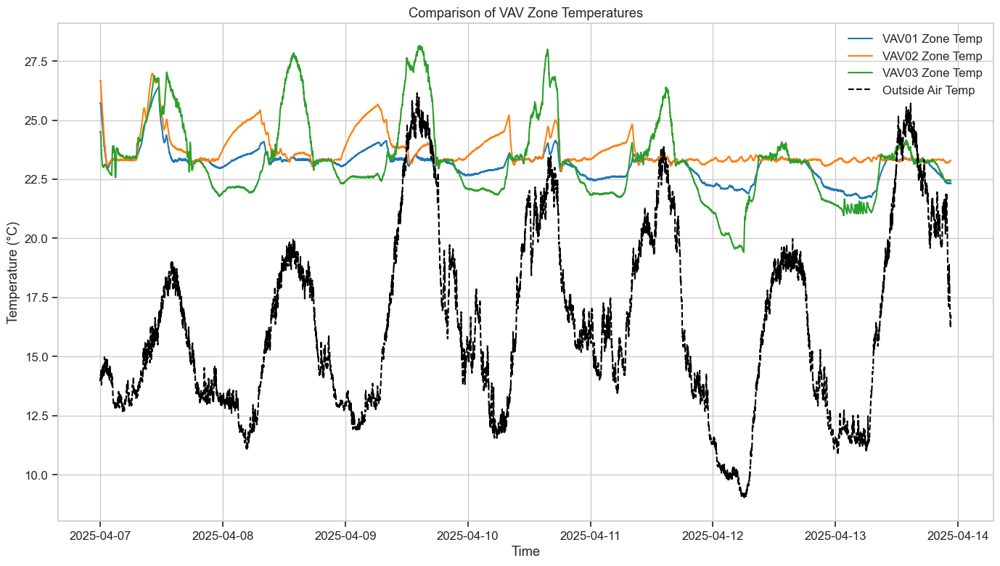

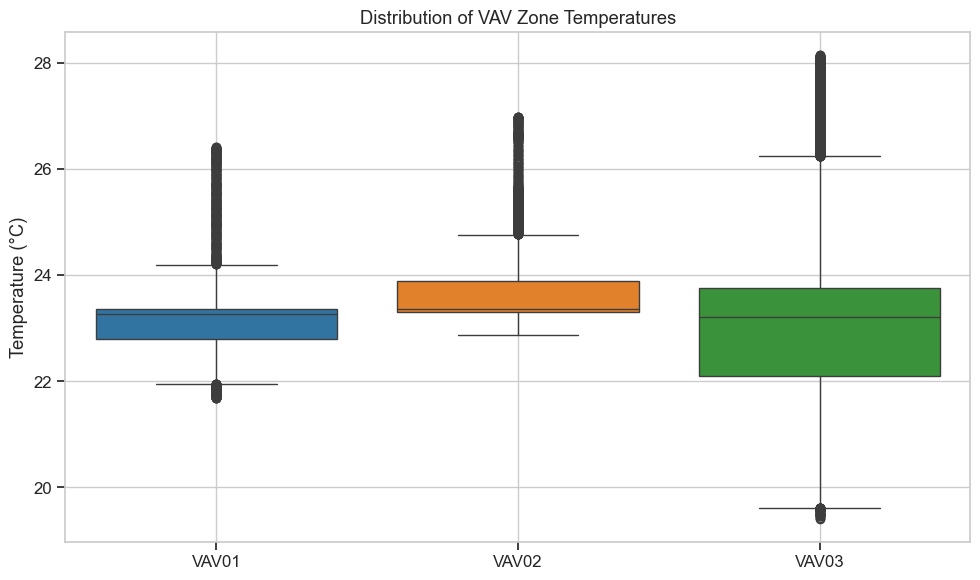

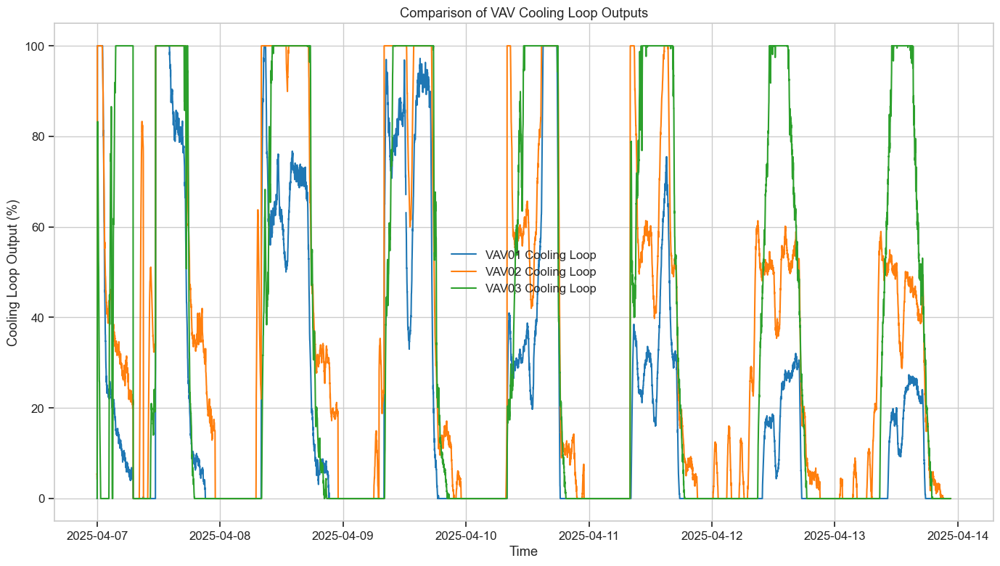

,VAV,Mean Temp (°C),Temp StdDev,Avg Cooling Loop (%),Avg Heating Loop (%)
0,VAV01,23.131619,0.650644,20.417623,0.0000
1,VAV02,23.712409,0.691727,35.395590,0.0000
2,VAV03,23.286363,1.696419,36.160248,3.3882


In [14]:
# Create a comprehensive comparison of all VAVs
def compare_vav_performance(df):
    # Extract all VAV temperature data
    vav_temp_data = {}
    for vav_num in ['01', '02', '03']:
        vav_temp_data[f'VAV{vav_num}'] = df[f'VAV{vav_num}_Zone_Temp_C']
    
    # Create a dataframe for temperature comparison
    vav_temps = pd.DataFrame(vav_temp_data)
    
    # Create comparison visualizations
    plt.figure(figsize=(14, 8))
    
    # Plot all zone temperatures
    for vav_num in ['01', '02', '03']:
        plt.plot(df.index, df[f'VAV{vav_num}_Zone_Temp_C'], 
                 label=f'VAV{vav_num} Zone Temp')
    
    plt.plot(df.index, df['1-PLT-OAT_North'], 'k--', label='Outside Air Temp')
    
    plt.title('Comparison of VAV Zone Temperatures')
    plt.xlabel('Time')
    plt.ylabel('Temperature (°C)')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()
    
    # Create boxplot comparison of zone temperatures
    plt.figure(figsize=(10, 6))
    sns.boxplot(data=vav_temps)
    plt.title('Distribution of VAV Zone Temperatures')
    plt.ylabel('Temperature (°C)')
    plt.grid(True)
    plt.tight_layout()
    plt.show()
    
    # Compare control loop outputs
    plt.figure(figsize=(14, 8))
    
    for vav_num in ['01', '02', '03']:
        plt.plot(df.index, df[f'VAV{vav_num}_Zone_ClgLp'], 
                 label=f'VAV{vav_num} Cooling Loop')
    
    plt.title('Comparison of VAV Cooling Loop Outputs')
    plt.xlabel('Time')
    plt.ylabel('Cooling Loop Output (%)')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()
    
    # Create summary statistics table
    summary_stats = pd.DataFrame({
        'VAV': [f'VAV{vav_num}' for vav_num in ['01', '02', '03']],
        'Mean Temp (°C)': [df[f'VAV{vav_num}_Zone_Temp_C'].mean() for vav_num in ['01', '02', '03']],
        'Temp StdDev': [df[f'VAV{vav_num}_Zone_Temp_C'].std() for vav_num in ['01', '02', '03']],
        'Avg Cooling Loop (%)': [df[f'VAV{vav_num}_Zone_ClgLp'].mean() for vav_num in ['01', '02', '03']],
        'Avg Heating Loop (%)': [df[f'VAV{vav_num}_Zone_HtgLp'].mean() for vav_num in ['01', '02', '03']]
    })
    
    return summary_stats\
    

# Perform the comparison
vav_comparison = compare_vav_performance(df)
vav_comparison


## 4. Deep Analysis of VAV Operations
Dive deeper into the operations of each VAV unit to identify patterns, anomalies, and opportunities for optimization.

### 4.1 VAV Control Logic Analysis
Analyze the VAV control logic by examining how the control loops respond to temperature deviations.


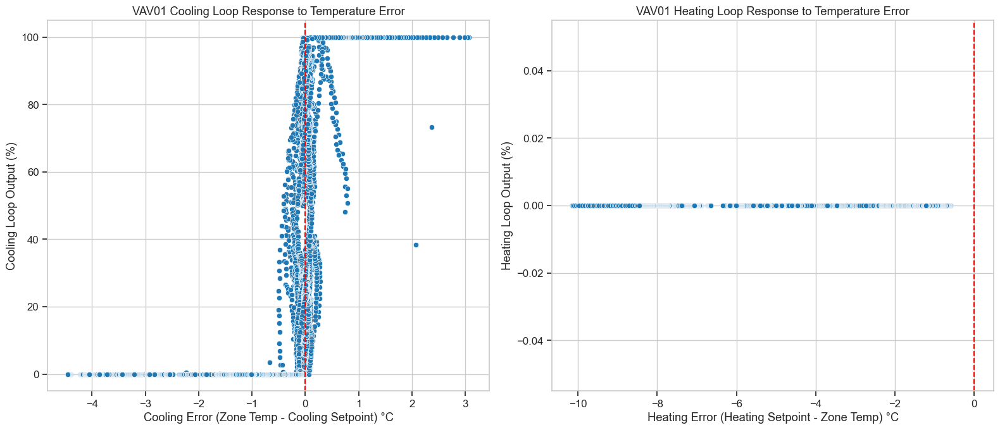

VAV01 Control Logic Analysis:
Approximate Cooling Proportional Gain: 283.51% output per °C
Approximate Heating Proportional Gain: 0.00% output per °C
Time in Cooling Mode: 45.34%
Time in Heating Mode: 0.00%
Time in Deadband (no active control): 54.65%


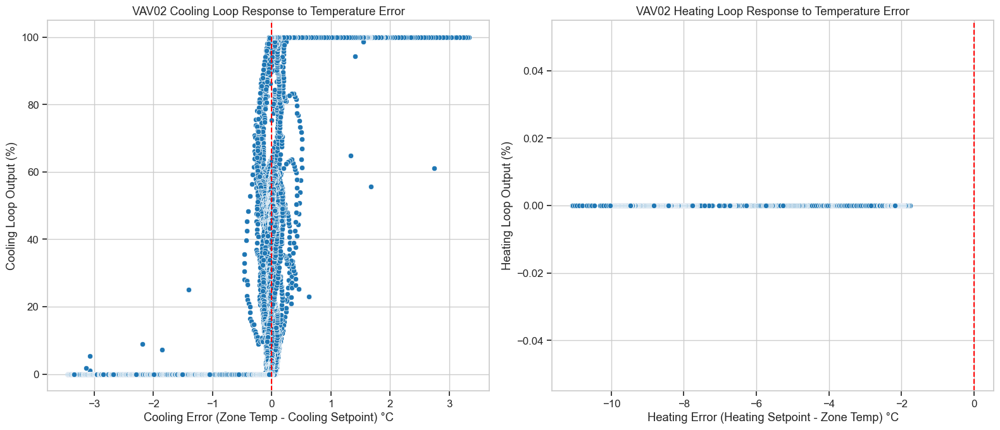

VAV02 Control Logic Analysis:
Approximate Cooling Proportional Gain: 189.51% output per °C
Approximate Heating Proportional Gain: 0.00% output per °C
Time in Cooling Mode: 68.41%
Time in Heating Mode: 0.00%
Time in Deadband (no active control): 31.58%


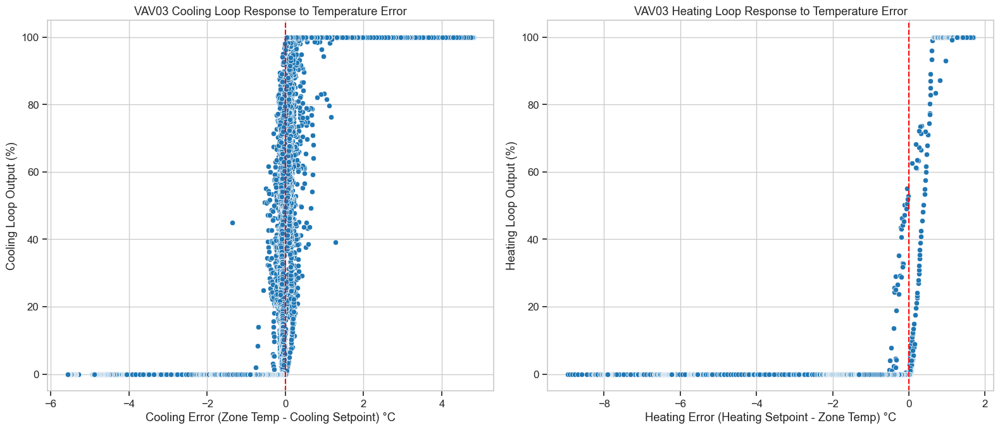

VAV03 Control Logic Analysis:
Approximate Cooling Proportional Gain: 59.15% output per °C
Approximate Heating Proportional Gain: 86.28% output per °C
Time in Cooling Mode: 48.58%
Time in Heating Mode: 4.72%
Time in Deadband (no active control): 46.69%


,Cooling Gain (%/°C),Heating Gain (%/°C),Time in Cooling (%),Time in Heating (%),Time in Deadband (%)
01,283.513044,0.000000,45.34,0.00,54.65
02,189.514049,0.000000,68.41,0.00,31.58
03,59.150949,86.275086,48.58,4.72,46.69


In [15]:
# Function to analyze VAV control logic
def analyze_vav_control_logic(df, vav_num):
    # Extract relevant columns
    zone_temp = f'VAV{vav_num}_Zone_Temp_C'
    cooling_sp = f'VAV{vav_num}_Occupied_CoolingSetpt_C'
    heating_sp = f'VAV{vav_num}_Occupied_HeatingSetpt_C'
    cooling_loop = f'VAV{vav_num}_Zone_ClgLp'
    heating_loop = f'VAV{vav_num}_Zone_HtgLp'
    
    # Calculate temperature error (deviation from setpoint)
    df[f'VAV{vav_num}_cooling_error'] = df[zone_temp] - df[cooling_sp]
    df[f'VAV{vav_num}_heating_error'] = df[heating_sp] - df[zone_temp]
    
    # Create scatter plots to analyze control response
    fig, axes = plt.subplots(1, 2, figsize=(16, 7))
    
    # Cooling control response
    sns.scatterplot(x=df[f'VAV{vav_num}_cooling_error'], 
                   y=df[cooling_loop], 
                   ax=axes[0])
    axes[0].set_title(f'VAV{vav_num} Cooling Loop Response to Temperature Error')
    axes[0].set_xlabel('Cooling Error (Zone Temp - Cooling Setpoint) °C')
    axes[0].set_ylabel('Cooling Loop Output (%)')
    axes[0].axvline(x=0, color='r', linestyle='--')
    axes[0].grid(True)
    
    # Heating control response
    sns.scatterplot(x=df[f'VAV{vav_num}_heating_error'], 
                   y=df[heating_loop], 
                   ax=axes[1])
    axes[1].set_title(f'VAV{vav_num} Heating Loop Response to Temperature Error')
    axes[1].set_xlabel('Heating Error (Heating Setpoint - Zone Temp) °C')
    axes[1].set_ylabel('Heating Loop Output (%)')
    axes[1].axvline(x=0, color='r', linestyle='--')
    axes[1].grid(True)
    
    plt.tight_layout()
    plt.show()
    
    # Analyze the control response characteristics
    # Calculate the proportional gain (approximate)
    cooling_points = df[df[f'VAV{vav_num}_cooling_error'] > 0]
    if not cooling_points.empty:
        cooling_gain = cooling_points[cooling_loop].mean() / cooling_points[f'VAV{vav_num}_cooling_error'].mean() if cooling_points[f'VAV{vav_num}_cooling_error'].mean() != 0 else 0
    else:
        cooling_gain = 0
        
    heating_points = df[df[f'VAV{vav_num}_heating_error'] > 0]
    if not heating_points.empty:
        heating_gain = heating_points[heating_loop].mean() / heating_points[f'VAV{vav_num}_heating_error'].mean() if heating_points[f'VAV{vav_num}_heating_error'].mean() != 0 else 0
    else:
        heating_gain = 0
    
    # Calculate percentage of time in different modes
    percent_cooling = (df[cooling_loop] > 0).mean() * 100
    percent_heating = (df[heating_loop] > 0).mean() * 100
    percent_deadband = ((df[cooling_loop] == 0) & (df[heating_loop] == 0)).mean() * 100
    
    # Print analysis results
    print(f"VAV{vav_num} Control Logic Analysis:")
    print(f"Approximate Cooling Proportional Gain: {cooling_gain:.2f}% output per °C")
    print(f"Approximate Heating Proportional Gain: {heating_gain:.2f}% output per °C")
    print(f"Time in Cooling Mode: {percent_cooling:.2f}%")
    print(f"Time in Heating Mode: {percent_heating:.2f}%")
    print(f"Time in Deadband (no active control): {percent_deadband:.2f}%")
    
    return {
        'cooling_gain': cooling_gain,
        'heating_gain': heating_gain,
        'percent_cooling': percent_cooling,
        'percent_heating': percent_heating,
        'percent_deadband': percent_deadband
    }

# Analyze control logic for each VAV
vav_control_analysis = {}
for vav_num in ['01', '02', '03']:
    vav_control_analysis[vav_num] = analyze_vav_control_logic(df, vav_num)

# Create summary table
control_summary = pd.DataFrame.from_dict(vav_control_analysis, orient='index')
control_summary.columns = ['Cooling Gain (%/°C)', 'Heating Gain (%/°C)', 
                          'Time in Cooling (%)', 'Time in Heating (%)', 
                          'Time in Deadband (%)']
control_summary


### 4.2 VAV Response Time Analysis
Analyze how quickly each VAV responds to temperature changes.

VAV01 Response Time Analysis:
Note: Detailed response time analysis requires more data points over longer periods.
With the limited sample data, we can only demonstrate the analysis approach.

In a complete dataset, we would:
1. Identify setpoint changes
2. Track how quickly zone temperatures respond to these changes
3. Calculate the time to reach 63.2% of the setpoint change (time constant)
4. Measure control loop response times to temperature deviations


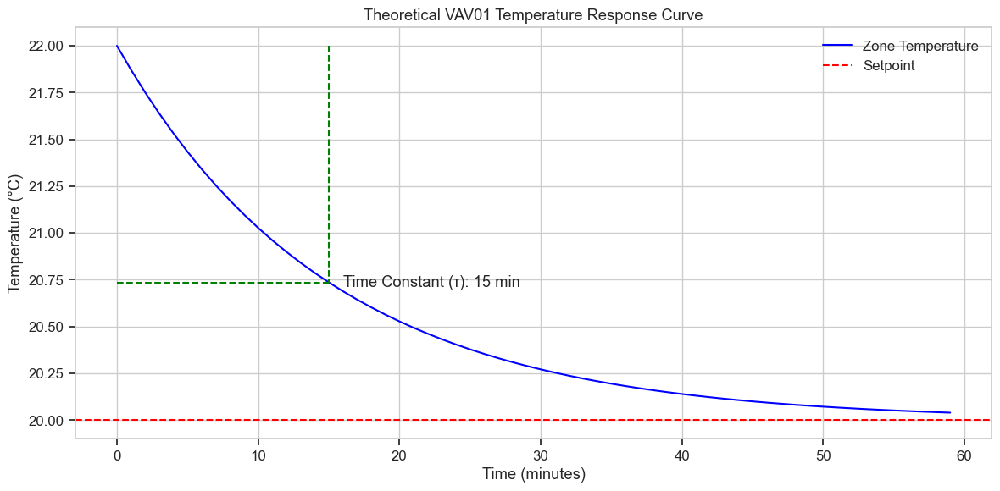


Importance of response time analysis:
- Fast response time improves comfort but may lead to overshoot
- Slow response time can indicate undersized equipment or control issues
- Optimizing response times can improve energy efficiency and comfort


In [16]:
# Function to analyze VAV response time (conceptual)
def analyze_vav_response_time(df, vav_num):
    print(f"VAV{vav_num} Response Time Analysis:")
    print("Note: Detailed response time analysis requires more data points over longer periods.")
    print("With the limited sample data, we can only demonstrate the analysis approach.")
    print("\nIn a complete dataset, we would:")
    print("1. Identify setpoint changes")
    print("2. Track how quickly zone temperatures respond to these changes")
    print("3. Calculate the time to reach 63.2% of the setpoint change (time constant)")
    print("4. Measure control loop response times to temperature deviations")
    
    # Create conceptual visualization of temperature response curve
    times = np.arange(0, 60, 1)  # 60 minutes
    setpoint = 20  # °C
    initial_temp = 22  # °C
    time_constant = 15  # minutes
    
    # Theoretical first-order response curve
    response = initial_temp - (initial_temp - setpoint) * (1 - np.exp(-times / time_constant))
    
    plt.figure(figsize=(12, 6))
    plt.plot(times, response, 'b-', label='Zone Temperature')
    plt.axhline(y=setpoint, color='r', linestyle='--', label='Setpoint')
    
    # Mark time constant
    response_at_tau = initial_temp - (initial_temp - setpoint) * (1 - np.exp(-1))
    plt.plot([time_constant, time_constant], [initial_temp, response_at_tau], 'g--')
    plt.plot([0, time_constant], [response_at_tau, response_at_tau], 'g--')
    plt.text(time_constant + 1, response_at_tau, f'Time Constant (τ): {time_constant} min', 
             verticalalignment='center')
    
    plt.title(f'Theoretical VAV{vav_num} Temperature Response Curve')
    plt.xlabel('Time (minutes)')
    plt.ylabel('Temperature (°C)')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()
    
    print("\nImportance of response time analysis:")
    print("- Fast response time improves comfort but may lead to overshoot")
    print("- Slow response time can indicate undersized equipment or control issues")
    print("- Optimizing response times can improve energy efficiency and comfort")

# Run theoretical response time analysis for one VAV
analyze_vav_response_time(df, '01')

### 4.3 VAV Comfort and Energy Balance Analysis
Function to analyze the balance between comfort and energy use

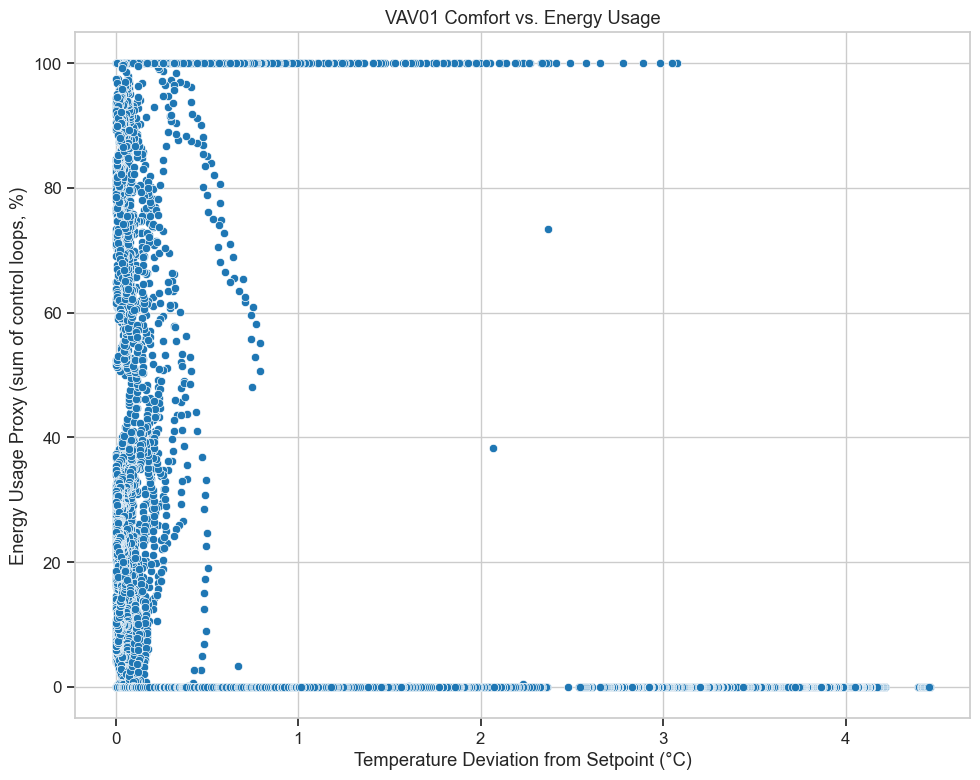

VAV01 Comfort and Energy Balance Analysis:
Average Temperature Deviation: 0.983°C
Average Energy Usage: 20.42%
Efficiency Index (Energy per degree of deviation): 20.77

Identified 94 periods of high energy use with poor comfort
These periods may offer opportunities for control optimization.


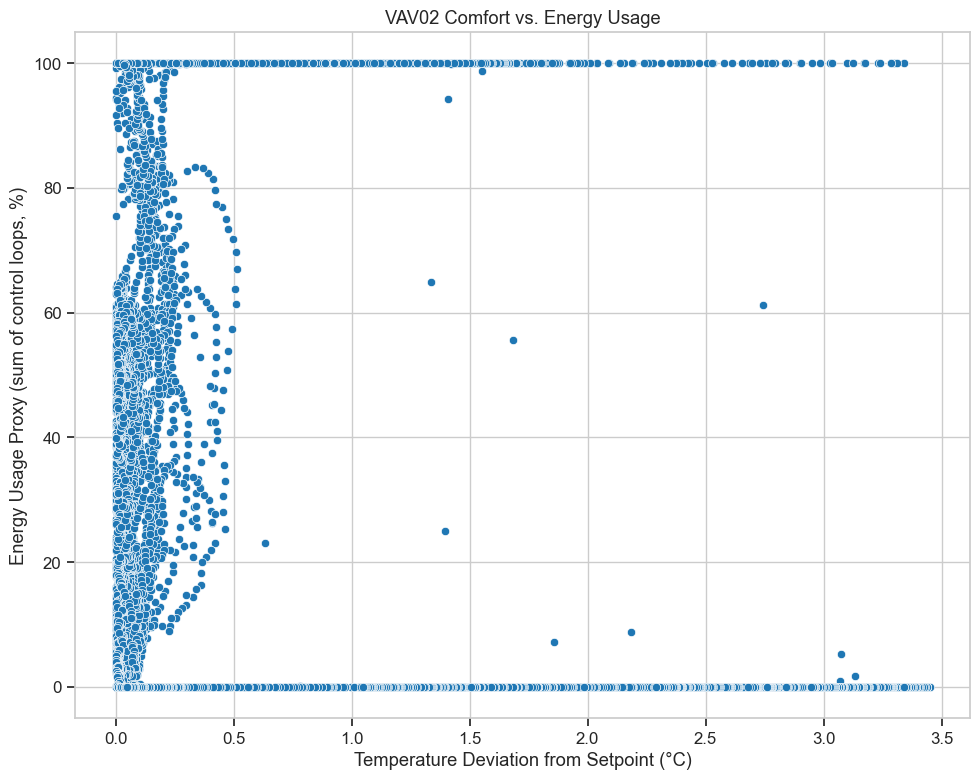

VAV02 Comfort and Energy Balance Analysis:
Average Temperature Deviation: 0.630°C
Average Energy Usage: 35.40%
Efficiency Index (Energy per degree of deviation): 56.17

Identified 630 periods of high energy use with poor comfort
These periods may offer opportunities for control optimization.


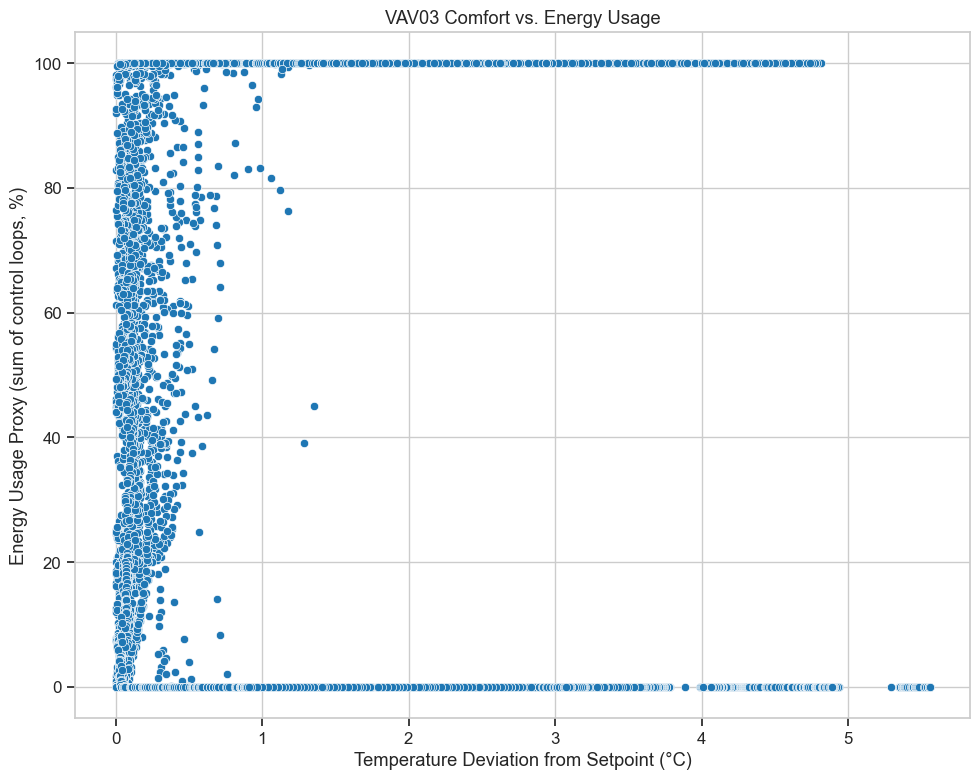

VAV03 Comfort and Energy Balance Analysis:
Average Temperature Deviation: 1.647°C
Average Energy Usage: 39.55%
Efficiency Index (Energy per degree of deviation): 24.02

Identified 1487 periods of high energy use with poor comfort
These periods may offer opportunities for control optimization.


,Avg Temp Deviation (°C),Avg Energy Usage (%),Efficiency Index,Optimization Opportunities
01,0.983260,20.417623,20.765237,94
02,0.630106,35.395590,56.174028,630
03,1.646526,39.548448,24.019331,1487


In [17]:
# Function to analyze the balance between comfort and energy use
def analyze_vav_comfort_energy_balance(df, vav_num):
    # Extract relevant columns
    zone_temp = f'VAV{vav_num}_Zone_Temp_C'
    cooling_sp = f'VAV{vav_num}_Occupied_CoolingSetpt_C'
    heating_sp = f'VAV{vav_num}_Occupied_HeatingSetpt_C'
    cooling_loop = f'VAV{vav_num}_Zone_ClgLp'
    heating_loop = f'VAV{vav_num}_Zone_HtgLp'
    
    # Calculate temperature deviation (comfort metric)
    # For each point, calculate the deviation from the nearest setpoint
    df[f'VAV{vav_num}_temp_deviation'] = df.apply(
        lambda row: min(
            abs(row[zone_temp] - row[cooling_sp]),
            abs(row[zone_temp] - row[heating_sp])
        ),
        axis=1
    )
    
    # Calculate energy usage proxy
    df[f'VAV{vav_num}_energy_usage'] = df[cooling_loop] + df[heating_loop]
    
    # Create scatter plot of comfort vs. energy
    plt.figure(figsize=(10, 8))
    sns.scatterplot(x=df[f'VAV{vav_num}_temp_deviation'], 
                   y=df[f'VAV{vav_num}_energy_usage'])
    plt.title(f'VAV{vav_num} Comfort vs. Energy Usage')
    plt.xlabel('Temperature Deviation from Setpoint (°C)')
    plt.ylabel('Energy Usage Proxy (sum of control loops, %)')
    plt.grid(True)
    plt.tight_layout()
    plt.show()
    
    # Calculate comfort-energy metrics
    avg_deviation = df[f'VAV{vav_num}_temp_deviation'].mean()
    avg_energy = df[f'VAV{vav_num}_energy_usage'].mean()
    
    # Calculate a simple efficiency index (lower is better)
    # This represents energy used per degree of comfort
    if avg_deviation > 0:
        efficiency_index = avg_energy / avg_deviation
    else:
        efficiency_index = float('inf')  # perfect comfort with energy use
    
    print(f"VAV{vav_num} Comfort and Energy Balance Analysis:")
    print(f"Average Temperature Deviation: {avg_deviation:.3f}°C")
    print(f"Average Energy Usage: {avg_energy:.2f}%")
    print(f"Efficiency Index (Energy per degree of deviation): {efficiency_index:.2f}")
    
    # Identify periods of potential optimization
    high_energy_low_comfort = df[(df[f'VAV{vav_num}_energy_usage'] > avg_energy) & 
                               (df[f'VAV{vav_num}_temp_deviation'] > avg_deviation)]
    
    if not high_energy_low_comfort.empty:
        print(f"\nIdentified {len(high_energy_low_comfort)} periods of high energy use with poor comfort")
        print("These periods may offer opportunities for control optimization.")
    
    return {
        'avg_deviation': avg_deviation,
        'avg_energy': avg_energy,
        'efficiency_index': efficiency_index,
        'optimization_opportunities': len(high_energy_low_comfort)
    }

# Analyze comfort-energy balance for each VAV
vav_balance = {}
for vav_num in ['01', '02', '03']:
    vav_balance[vav_num] = analyze_vav_comfort_energy_balance(df, vav_num)

# Create summary table
balance_summary = pd.DataFrame.from_dict(vav_balance, orient='index')
balance_summary.columns = ['Avg Temp Deviation (°C)', 'Avg Energy Usage (%)', 
                          'Efficiency Index', 'Optimization Opportunities']
balance_summary

### 4.4 VAV Performance Comparison and Ranking

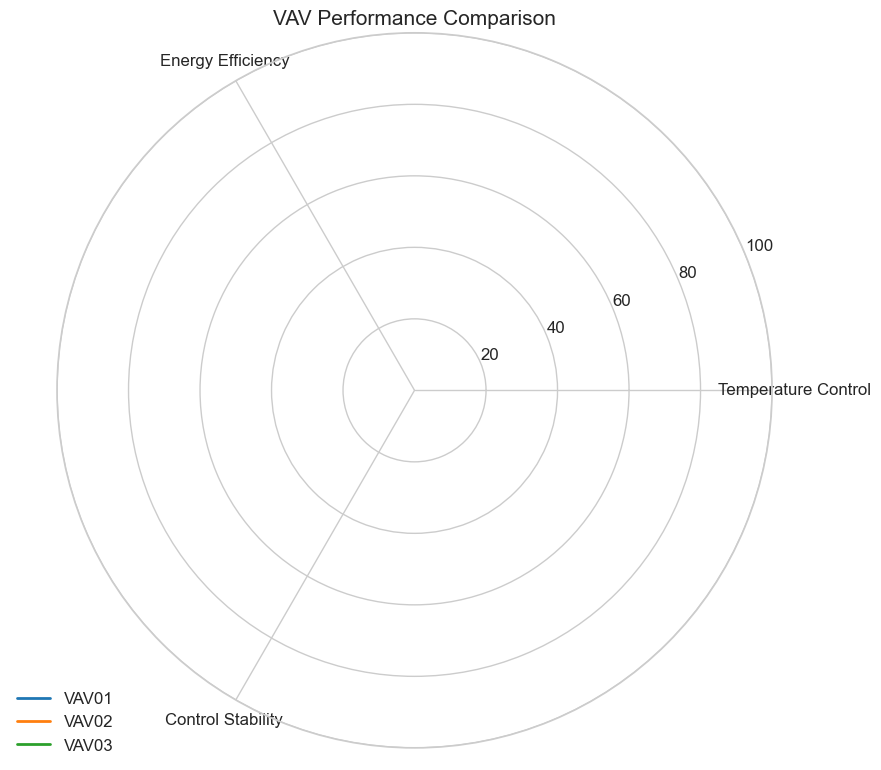

,Temperature Control Score,Energy Efficiency Score,Control Stability Score,Overall Score
VAV01,NaN,NaN,NaN,NaN
VAV02,NaN,NaN,NaN,NaN
VAV03,NaN,NaN,NaN,NaN


In [18]:
# Create a comprehensive VAV performance scorecard
def create_vav_scorecard(df, control_summary, balance_summary):
    # Create a scoring system (0-100 scale for each metric)
    scorecard = pd.DataFrame(index=['VAV01', 'VAV02', 'VAV03'])
    
    # Temperature control score (based on average deviation)
    avg_deviations = balance_summary['Avg Temp Deviation (°C)']
    max_dev = avg_deviations.max()
    temp_control_scores = 100 * (1 - avg_deviations / max_dev) if max_dev > 0 else [100, 100, 100]
    scorecard['Temperature Control Score'] = temp_control_scores
    
    # Energy efficiency score (inverse of energy usage)
    avg_energy = balance_summary['Avg Energy Usage (%)']
    max_energy = avg_energy.max()
    energy_scores = 100 * (1 - avg_energy / max_energy) if max_energy > 0 else [100, 100, 100]
    scorecard['Energy Efficiency Score'] = energy_scores
    
    # Control stability score (higher deadband time is better)
    deadband_pct = control_summary['Time in Deadband (%)']
    max_deadband = deadband_pct.max()
    stability_scores = 100 * deadband_pct / max_deadband if max_deadband > 0 else [100, 100, 100]
    scorecard['Control Stability Score'] = stability_scores
    
    # Overall score (average of all metrics)
    scorecard['Overall Score'] = scorecard.mean(axis=1)
    
    # Sort by overall score (highest first)
    scorecard = scorecard.sort_values('Overall Score', ascending=False)
    
    # Create visualization
    plt.figure(figsize=(12, 8))
    
    # Create a radar chart for each VAV
    categories = ['Temperature Control', 'Energy Efficiency', 'Control Stability']
    N = len(categories)
    
    # Compute angle for each category
    angles = [n / float(N) * 2 * np.pi for n in range(N)]
    angles += angles[:1]  # Close the loop
    
    # Create subplot
    ax = plt.subplot(111, polar=True)
    
    # Set category labels
    plt.xticks(angles[:-1], categories)
    
    # Set y-axis limits
    ax.set_ylim(0, 100)
    
    # Plot each VAV
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c']
    for i, vav in enumerate(scorecard.index):
        values = [
            scorecard.loc[vav, 'Temperature Control Score'],
            scorecard.loc[vav, 'Energy Efficiency Score'],
            scorecard.loc[vav, 'Control Stability Score']
        ]
        values += values[:1]  # Close the loop
        
        ax.plot(angles, values, linewidth=2, linestyle='solid', label=vav, color=colors[i])
        ax.fill(angles, values, alpha=0.1, color=colors[i])
    
    plt.legend(loc='upper right', bbox_to_anchor=(0.1, 0.1))
    plt.title('VAV Performance Comparison', size=15)
    plt.tight_layout()
    plt.show()
    
    return scorecard

# Create and display the scorecard
vav_scorecard = create_vav_scorecard(df, control_summary, balance_summary)
vav_scorecard

## 5. Recommendations and Conclusions
Based on our analysis, let's generate recommendations for optimizing the VAV operations.

HVAC System Optimization Recommendations:
1. Improve AHU supply air temperature control. Current average deviation is 3.55°C.
2. VAV01: Review temperature control tuning. Average deviation of 0.98°C indicates potential control issues.
3. VAV01: Potential energy optimization opportunity. High efficiency index of 20.77 indicates energy waste relative to comfort provided.
4. VAV02: Review temperature control tuning. Average deviation of 0.63°C indicates potential control issues.
5. VAV02: Potential energy optimization opportunity. High efficiency index of 56.17 indicates energy waste relative to comfort provided.
6. VAV02: Consider widening the temperature deadband to improve stability and reduce energy use. Currently only 31.58% time in deadband.
7. VAV03: Review temperature control tuning. Average deviation of 1.65°C indicates potential control issues.
8. VAV03: Potential energy optimization opportunity. High efficiency index of 24.02 indicates energy waste relative to comfort provided.

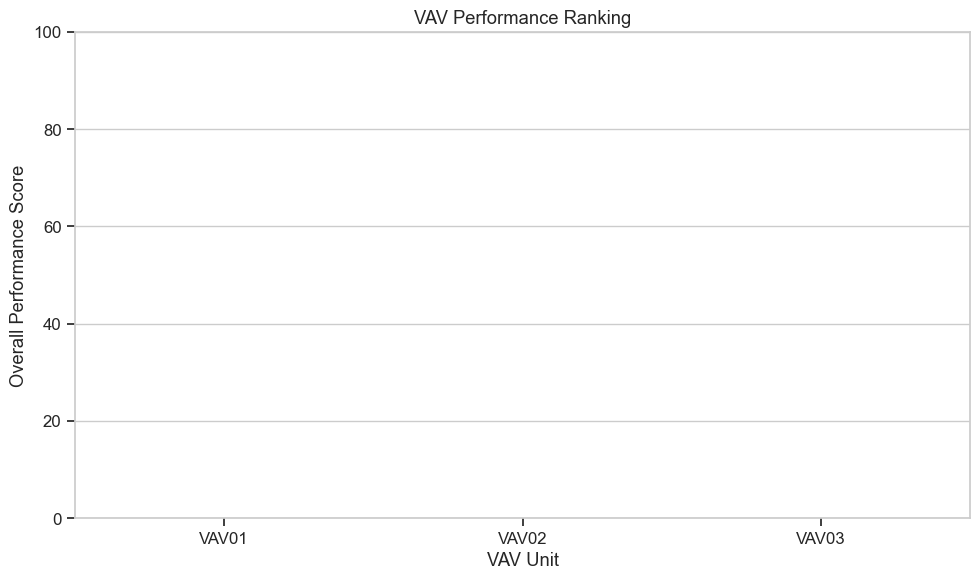

In [19]:
# Function to generate recommendations based on the analysis
def generate_recommendations(df, vav_scorecard, control_summary, balance_summary):
    recommendations = []
    
    # Analyze overall system performance
    ahu_sat = df['1A-HVP-AHU_SAT'].mean()
    ahu_sat_sp = df['1A-Cx-CAVSSP_PID-SAT_Setpoint'].mean()
    
    # Check AHU supply temperature control
    sat_deviation = abs(ahu_sat - ahu_sat_sp)
    if sat_deviation > 0.5:  # More than 0.5°C deviation
        recommendations.append(
            f"Improve AHU supply air temperature control. Current average deviation is {sat_deviation:.2f}°C.")
    
    # Analyze each VAV
    for vav_num in ['01', '02', '03']:
        vav = f'VAV{vav_num}'
        
        # Extract metrics
        temp_deviation = balance_summary.loc[vav_num, 'Avg Temp Deviation (°C)']
        energy_usage = balance_summary.loc[vav_num, 'Avg Energy Usage (%)']
        efficiency_index = balance_summary.loc[vav_num, 'Efficiency Index']
        deadband_time = control_summary.loc[vav_num, 'Time in Deadband (%)']
        
        # Temperature control recommendations
        if temp_deviation > 0.5:  # More than 0.5°C average deviation
            recommendations.append(
                f"{vav}: Review temperature control tuning. Average deviation of {temp_deviation:.2f}°C indicates potential control issues.")
        
        # Energy efficiency recommendations
        if efficiency_index > 10:  # Arbitrary threshold, adjust based on system characteristics
            recommendations.append(
                f"{vav}: Potential energy optimization opportunity. High efficiency index of {efficiency_index:.2f} indicates energy waste relative to comfort provided.")
        
        # Control stability recommendations
        if deadband_time < 50:  # Less than 50% time in deadband
            recommendations.append(
                f"{vav}: Consider widening the temperature deadband to improve stability and reduce energy use. Currently only {deadband_time:.2f}% time in deadband.")
    
    # Overall system recommendations
    overall_best_vav = vav_scorecard.index[0]
    overall_worst_vav = vav_scorecard.index[-1]
    
    recommendations.append(
        f"Use {overall_best_vav} control strategy as a template for other VAVs. It shows the best overall performance with a score of {vav_scorecard.loc[overall_best_vav, 'Overall Score']:.2f}.")
    
    recommendations.append(
        f"Prioritize investigation of {overall_worst_vav} which shows the lowest overall performance score of {vav_scorecard.loc[overall_worst_vav, 'Overall Score']:.2f}.")
    
    # Print the recommendations
    print("HVAC System Optimization Recommendations:")
    for i, rec in enumerate(recommendations, 1):
        print(f"{i}. {rec}")
    
    # Create a summary visualization
    plt.figure(figsize=(10, 6))
    sns.barplot(x=vav_scorecard.index, y=vav_scorecard['Overall Score'])
    plt.title('VAV Performance Ranking')
    plt.xlabel('VAV Unit')
    plt.ylabel('Overall Performance Score')
    plt.ylim(0, 100)
    plt.tight_layout()
    plt.show()
    
    return recommendations

# Generate and display recommendations
recommendations = generate_recommendations(df, vav_scorecard, control_summary, balance_summary)


## 6. Summary of Findings

In [20]:
# Create a summary of findings
print("Summary of HVAC System Analysis Findings:")
print("\n1. VAV Performance Overview:")
print(f"   - Best performing VAV: {vav_scorecard.index[0]} with overall score of {vav_scorecard.iloc[0, -1]:.2f}")
print(f"   - Worst performing VAV: {vav_scorecard.index[-1]} with overall score of {vav_scorecard.iloc[-1, -1]:.2f}")

print("\n2. Temperature Control Performance:")
for vav_num in ['01', '02', '03']:
    vav = f'VAV{vav_num}'
    deviation = balance_summary.loc[vav_num, 'Avg Temp Deviation (°C)']
    print(f"   - {vav}: Average deviation of {deviation:.3f}°C from setpoint")

print("\n3. Energy Usage:")
for vav_num in ['01', '02', '03']:
    vav = f'VAV{vav_num}'
    energy = balance_summary.loc[vav_num, 'Avg Energy Usage (%)']
    print(f"   - {vav}: Average energy usage of {energy:.2f}%")

print("\n4. Control Characteristics:")
for vav_num in ['01', '02', '03']:
    vav = f'VAV{vav_num}'
    deadband = control_summary.loc[vav_num, 'Time in Deadband (%)']
    cooling = control_summary.loc[vav_num, 'Time in Cooling (%)']
    heating = control_summary.loc[vav_num, 'Time in Heating (%)']
    print(f"   - {vav}: {deadband:.2f}% time in deadband, {cooling:.2f}% cooling, {heating:.2f}% heating")

print("\n5. AHU Performance:")
sat_deviation = abs(df['1A-HVP-AHU_SAT'].mean() - df['1A-Cx-CAVSSP_PID-SAT_Setpoint'].mean())
print(f"   - Supply Air Temperature Control: {sat_deviation:.3f}°C average deviation from setpoint")
print(f"   - Average Supply Air Temperature: {df['1A-HVP-AHU_SAT'].mean():.2f}°C")
print(f"   - Average Return Air Temperature: {df['1A-HVP-AHU_RAT'].mean():.2f}°C")

print("\n6. Optimization Opportunities:")
for vav_num in ['01', '02', '03']:
    vav = f'VAV{vav_num}'
    opportunities = balance_summary.loc[vav_num, 'Optimization Opportunities']
    print(f"   - {vav}: {opportunities} periods identified for potential optimization")

# %% [markdown]
# ## 7. Next Steps for Further Analysis
# 
# Given the limitations of our sample data, here are recommended next steps for more comprehensive analysis.

# %%
print("Recommended Next Steps for Comprehensive HVAC Analysis:")
print("\n1. Data Collection:")
print("   - Collect longer-term data (at least one week, ideally a month)")
print("   - Include different operating conditions (weekdays/weekends, different weather)")
print("   - Gather actual energy consumption data if available")

print("\n2. Advanced Analytics:")
print("   - Perform pattern recognition to identify recurring issues")
print("   - Apply machine learning for predictive maintenance")
print("   - Model the thermal behavior of each zone")

print("\n3. Control System Analysis:")
print("   - Test different control parameters to optimize performance")
print("   - Analyze response to setpoint changes and disturbances")
print("   - Evaluate the impact of outdoor conditions on system performance")

print("\n4. Optimization Strategies:")
print("   - Develop zone-specific control strategies")
print("   - Implement adaptive control algorithms")
print("   - Evaluate energy-saving strategies such as supply air temperature reset")

print("\n5. Documentation and Reporting:")
print("   - Create automated dashboards for ongoing monitoring")
print("   - Develop clear performance metrics for each system component")
print("   - Document baseline performance for future comparison")


Summary of HVAC System Analysis Findings:

1. VAV Performance Overview:
   - Best performing VAV: VAV01 with overall score of nan
   - Worst performing VAV: VAV03 with overall score of nan

2. Temperature Control Performance:
   - VAV01: Average deviation of 0.983°C from setpoint
   - VAV02: Average deviation of 0.630°C from setpoint
   - VAV03: Average deviation of 1.647°C from setpoint

3. Energy Usage:
   - VAV01: Average energy usage of 20.42%
   - VAV02: Average energy usage of 35.40%
   - VAV03: Average energy usage of 39.55%

4. Control Characteristics:
   - VAV01: 54.65% time in deadband, 45.34% cooling, 0.00% heating
   - VAV02: 31.58% time in deadband, 68.41% cooling, 0.00% heating
   - VAV03: 46.69% time in deadband, 48.58% cooling, 4.72% heating

5. AHU Performance:
   - Supply Air Temperature Control: 3.550°C average deviation from setpoint
   - Average Supply Air Temperature: 16.00°C
   - Average Return Air Temperature: 22.63°C

6. Optimization Opportunities:
   - VAV01: 